# Final Project - 6105 Data Science
                                        -2020 Spring

## Topic:Trending YouTube Video Statistics
    --Daily statistics for trending YouTube videos

## Group Members:
1. 001443861 Hao Wu	
2. 001305642 Fangqing Wu
3. 001082876 Yangyang Liu
4. 001405396 Mengzhe Zhang
5. 001302072 Lihang Zhou


## <a name = "0"></a> Introduction

<h4>YouTube (the world-famous video sharing website) maintains a list of the top trending videos on the platform. According to Variety magazine, “To determine the year’s top-trending videos, YouTube uses a combination of factors including measuring users interactions (number of views, shares, comments and likes). Note that they’re not the most-viewed videos overall for the calendar year”. Top performers on the YouTube trending list are music videos (such as the famously virile “Gangam Style”), celebrity and/or reality TV performances, and the random dude-with-a-camera viral videos that YouTube is well-known for.

This dataset is a daily record of the top trending YouTube videos.

Content
This dataset includes several months (and counting) of data on daily trending YouTube videos. Data is included for the US, GB, DE, CA, and FR regions (USA, Great Britain, Germany, Canada, and France, respectively), with up to 200 listed trending videos per day.
</h4>


## <a name="0.1"> </a> Methodology
<p>Programming language :<b>Python</b></p> 
<p>Basic tools :<b>numpy, pandas, seaborn, matplotlib, json, datetime, IPython, glob</b></p>
<p>Machine Learning tools: <b>train_test_split, LinearRegression, PolynomialFeatures, r2_scores, Polynomial Regression, Random Forest, K-means Cluster</b></p>
<p>Advanced Tools: <b> nltk, WordCloud, spacy, TextBlob</b> </p>
<p>Algorithm: <b>Machine Learning (Linear Regression, Polynomial Regression, Random Forest,K-fold training, K-means Cluster,r2_score), Natural Language Processing:(Word frequency statstic, Sentiment recognization) </b></p>

#### Method Solving
* Using pandas, numpy and matplotlib processed a general visualization of data:
e.g.
The most influential video publisher; diverse topics; the videos with the most dislikes; 
the distrubution of LIKES & DISLIKES and so on. 
* Using IPython and glob to display a Html-source dataset (photo grids). 
* After getting a view of dislikes, likes, comment-counts, and views, getting correlations and heatmap for the modifieed dataset.
This relationship would be used in latter prediction model, by using Polynomial Regression and r2 score for evaluation. 
* Using wordcloud to count the frequency of words in description, tags, and title. 
* Using nltk to analyse the sentiments of words, and getting a view of it. 





## Task 
* Distrubution of attributes
* Correlation between Views & Likes
* Prediction about number of Likes
* Recommendation system
* Comment sentiment recognization

# Table of Contents

* [1. Importing dataset and data preprocessing](#1)<br>
    * [1.1. Importing essential libraries](#1.1)<br>
    * [1.2 Import dataset](#1)<br>
    * [1.3 Summary of the DataSet](#1.3)<br>
    * [1.4. Data preprocessing and feature engineering](#1.4)<br>
        * [1.4.1. Datetime format of Trending date and Publish time](#1.4.1)<br>
        * [1.4.2. Assignment of the film category](#1.4.2)<br>
        * [1.4.3. Dislike percentage](#1.4.3)<br>
        * [1.4.4 Number of words with all upper case in Title](#1.4.4)<br>
        * [1.4.5 Distribution of basic paramaters](#1.4.5)<br>
        * [1.4.6 Dealing with the duplicate data](#1.4.6)<br>
        * [1.4.7 Time to trend](#1.4.7)<br>
* [2. Data Visualization](#2)<br>
    * [2.1. Best time to publish video](#2.1)<br>
    * [2.2. most trending videos](#2.2)<br>
    * [2.3. The most influential video publisher](#2.3)<br>
    * [2.4. Diverse topics](#2.4)<br>
    * [2.5. The videos with the most dislikes](#2.5)<br>
    * [2.6. The distrubution of LIKES & DISLIKES](#2.6)<br>
    * [2.7. Correlation between dataset variables](#2.7)<br>
    * [2.8. Most common words in video titles](#2.8)<br>
    * [2.9. The popular channel](#2.9)<br>
    * [2.10. The distrubution of videos from categories](#2.10)<br>
    * [2.11. Simple feature extraction from the number of Likes, Dislikes and Comments](#2.11)<br>
* [3.Extract information from Tags & Description](#3)<br>
    * [3.1. Statistic & Preprocessing](#3.1)<br>
    * [3.2. The relationship between information from tag & description and the number of likes,dislikes,views and comments](#3.2)<br>
    * [3.3. The statstics of puncuation value](#3.3)<br>
    * [3.4. The correlation between the text and number of views](#3.4)<br>
    * [3.5. The visualization of titles, tags and descriptions by WordCloud](#3.5)<br>
    * [3.6. Sentiment Recognization]<br>
* [4. Machine Learning Model](#4)<br>
    * [4.1. Preprocessing](#4.1)<br>
    * [4.2. Predicting Views](#4.2)<br>
        * [4.2.1. Polynomial Regression]<br>
        * [4.2.2. Linear Regression]<br>
        * [4.2.3. Random Forest]<br>
    * [4.3. Predicting Likes](#4.3)<br>
        * [4.3.1. Linear Regression]<br>
        * [4.3.2. Random Forest]<br>
    * [4.4. Predicting number of Comments] <br>
        * [4.4.1. Linear Regression]<br>
        * [4.4.2. Random Forest]<br>
    * [4.5. Classification]<br>
* [5. Conclusion](#5)<br>
* [6. Reference](#6)<br>

## <a name="1"></a>1. Importing dataset and data preprocessing


### <a name="1.1"></a>1.1. Importing essential libraries

In [1]:
#basic
import pandas as pd
import numpy as np
import seaborn as sns
import json

#picture
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.colors as colors
%matplotlib inline

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
from collections import Counter
from scipy.optimize import curve_fit
import datetime

#nlp
import string
import re    #for regex
import nltk
from nltk.corpus import stopwords
import spacy
from nltk import pos_tag
from nltk.stem.wordnet import WordNetLemmatizer 
from nltk.tokenize import word_tokenize
import os
from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS

# Tweet tokenizer does not split at apostophes which is what we want
from nltk.tokenize import TweetTokenizer 

### <a name="1.2"></a>1.2 Import dataset

In [2]:
us_videos = pd.read_csv("USvideos.csv")
us_videos_categories = pd.read_json('US_category_id.json')

ca_videos = pd.read_csv('CAvideos.csv')
ca_video_categories = pd.read_json('CA_category_id.json')

# de_videos = pd.read_csv('DEvideos.csv')
# de_video_categories = pd.read_json('DE_category_id.json')

# fr_videos = pd.read_csv('FRvideos.csv')
# fr_video_categories =pd.read_json('FR_category_id.json')

gb_videos = pd.read_csv('GBvideos.csv')
gb_video_categories = pd.read_json('GB_category_id.json')

# in_videos = pd.read_csv('INvideos.csv')
# in_video_categories = pd.read_json('IN_category_id.json')
us_videos=pd.concat([us_videos,ca_videos])
us_videos=pd.concat([us_videos,gb_videos])

### <a name="1.3"></a>1.3 Summary of the DataSet


In [3]:
us_videos.head(1)


,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...


In [4]:
# us_videos.info()
# ca_videos.info()
# gb_videos.info()

### <a name="1.4"></a>1.4. Data preprocessing and feature engineering

#### <a name="1.4.1"></a>1.4.1. Datetime format of Trending date and Publish time

NOTE: We immediately see, that in the first place we have to process the raw data loaded from the file. Firstly we will transform trending_date as well as publish_time from string to datetime format. This will allow us to easily perform arithmetic operations and compare these values. publish_time column will be divided into two separate ones publish_date and publish_time. I am also curious what time it is best to publish videos to increase the likelihood of treanding. For this reason, I will create an additional column storing the time of publication - publish_hour .

In [5]:
# Transforming Trending date column to datetime format
us_videos['trending_date'] = pd.to_datetime(us_videos['trending_date'], format='%y.%d.%m').dt.date

# Transforming Trending date column to datetime format and splitting into two separate ones
publish_time = pd.to_datetime(us_videos['publish_time'], format='%Y-%m-%dT%H:%M:%S.%fZ')
us_videos['publish_date'] = publish_time.dt.date
us_videos['publish_time'] = publish_time.dt.time
us_videos['publish_hour'] = publish_time.dt.hour

us_videos.head(1)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,publish_date,publish_hour
0,2kyS6SvSYSE,2017-11-14,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,17:13:01,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,2017-11-13,17


#### <a name="1.4.2"></a>1.4.2. Assignment of the film category

NOTE: Next we will connect the films with the categories they belong to. We will associate the information in two files: USvideos.csv and US_category_id.json .

In [6]:
# We'll use a very nice python featur - dictionary comprehension, to extract most important data from US_category_id.json
categories = {category['id']: category['snippet']['title'] for category in us_videos_categories['items']}

# Now we will create new column that will represent name of category
us_videos.insert(4, 'category', us_videos['category_id'].astype(str).map(categories))
# us_videos.insert(4, 'category', ca_videos['category_id'].astype(str).map(ca_categories))
# us_videos.insert(4, 'category', gb_videos['category_id'].astype(str).map(gb_categories))

#### <a name="1.4.3"></a>1.4.3. Dislike percentage

In [7]:
us_videos['dislike_percentage'] = us_videos['dislikes'] / (us_videos['dislikes'] + us_videos['likes'])

In [8]:
print(us_videos['dislike_percentage'])

0        0.049030
1        0.059479
2        0.035271
3        0.061450
4        0.014819
           ...   
38911    0.045512
38912    0.181858
38913    0.022025
38914    0.231991
38915    0.014775
Name: dislike_percentage, Length: 120746, dtype: float64


#### <a name="1.4.4"></a>1.4.4 Number of words with all upper case in Title

In [9]:
# Helper function
def numberOfUpper(string):
    i = 0
    for word in string.split():
        if word.isupper():
            i += 1
    return(i)

us_videos["all_upper_in_title"] = us_videos["title"].apply(numberOfUpper)

#### <a name="1.4.5"></a>1.4.5 Distribution of basic paramaters

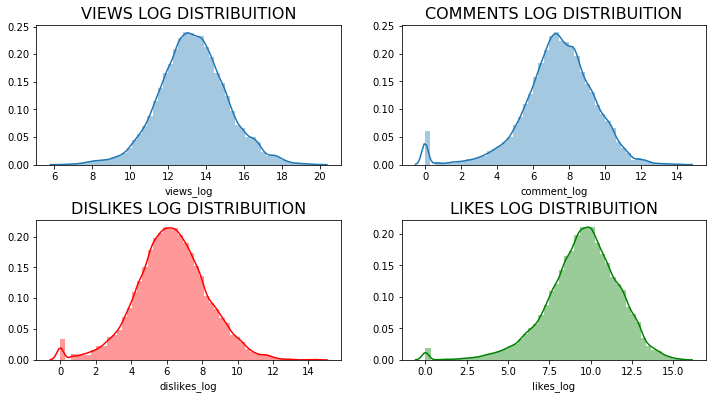

In [10]:
us_videos['likes_log'] = np.log(us_videos['likes'] + 1)
us_videos['views_log'] = np.log(us_videos['views'] + 1)
us_videos['dislikes_log'] = np.log(us_videos['dislikes'] + 1)
us_videos['comment_log'] = np.log(us_videos['comment_count'] + 1)

plt.figure(figsize = (12,6))

plt.subplot(221)
g1 = sns.distplot(us_videos['views_log'])
g1.set_title("VIEWS LOG DISTRIBUITION", fontsize=16)

plt.subplot(224)
g2 = sns.distplot(us_videos['likes_log'],color='green')
g2.set_title('LIKES LOG DISTRIBUITION', fontsize=16)

plt.subplot(223)
g3 = sns.distplot(us_videos['dislikes_log'], color='r')
g3.set_title("DISLIKES LOG DISTRIBUITION", fontsize=16)

plt.subplot(222)
g4 = sns.distplot(us_videos['comment_log'])
g4.set_title("COMMENTS LOG DISTRIBUITION", fontsize=16)

plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 0.9)

plt.show()

#### <a name="1.4.6"></a>1.4.6 Dealing with the duplicate data

In [11]:
#Because many of the films have been trending you several times, we will create a separate 
#datasets in which we will get rid of repetitions. Still, we leave the original dataset, 
#because there is a lot of interesting information in it.
us_videos_last = us_videos.drop_duplicates(subset=['video_id'], keep='last', inplace=False)
us_videos_first = us_videos.drop_duplicates(subset=['video_id'], keep='first', inplace=False)
print("us_videos dataset contains {} videos".format(us_videos.shape[0]))
print("us_videos_first dataset contains {} videos".format(us_videos_first.shape[0]))
print("us_videos_last dataset contains {} videos".format(us_videos_last.shape[0]))

us_videos dataset contains 120746 videos
us_videos_first dataset contains 30318 videos
us_videos_last dataset contains 30318 videos


#### <a name="1.4.7"></a>1.4.7 Time to trend

NOTE: Lastly we will create new feature time to trend representing the time (in days) between publication and the day when it became trending.



In [12]:
us_videos_first["time_to_trend"] = (us_videos_first.trending_date - us_videos_first.publish_date) / np.timedelta64(1, 'D')

## <a name="2"></a>2. Data Visualization

### <a name="2.1"></a>2.1. Best time to publish video

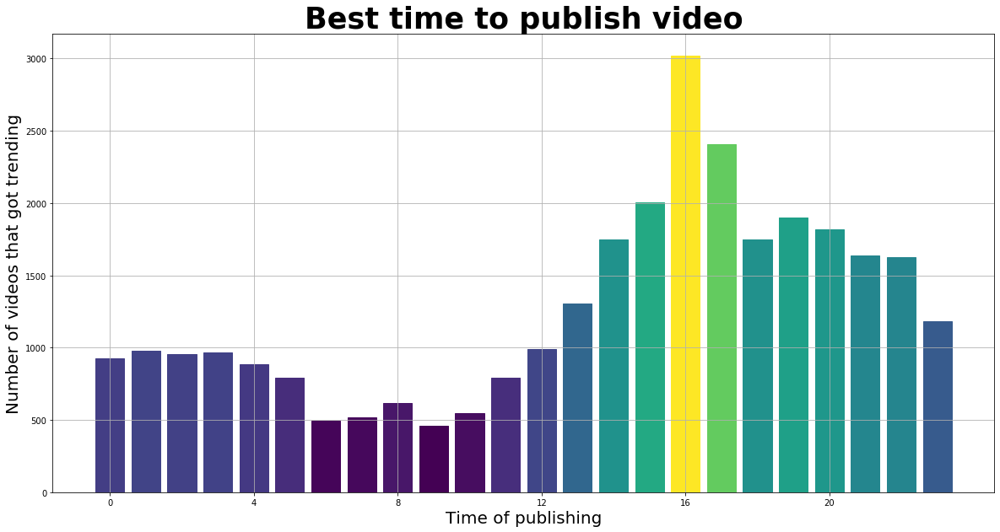

In [13]:
publish_h = [0] * 24

for index, row in us_videos_first.iterrows():
    publish_h[row["publish_hour"]] += 1
    
values = publish_h
ind = np.arange(len(values))


# Creating new plot
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)
ax.yaxis.grid()
ax.xaxis.grid()
bars = ax.bar(ind, values)

# Sampling of Colormap
for i, b in enumerate(bars):
    b.set_color(plt.cm.viridis((values[i] - min(values))/(max(values)- min(values))))
    
plt.ylabel('Number of videos that got trending', fontsize=20)
plt.xlabel('Time of publishing', fontsize=20)
plt.title('Best time to publish video', fontsize=35, fontweight='bold')
plt.xticks(np.arange(0, len(ind), len(ind)/6), [0, 4, 8, 12, 16, 20])

plt.show()

### <a name="2.2"></a>2.2 most trending videos

In [14]:
from IPython.display import HTML, display

# We choose the 10 most trending videos
selected_columns = ['title', 'channel_title', 'thumbnail_link', 'publish_date', 'category']

most_frequent = us_videos.groupby(selected_columns)['video_id'].agg(
    {"code_count": len}).sort_values(
    "code_count", ascending=False
).head(20).reset_index()

# Construction of HTML table with miniature photos assigned to the most popular movies
table_content = ''
max_title_length = 50

for date, row in most_frequent.T.iteritems():
    HTML_row = '<tr>'
    HTML_row += '<td><img src="' + str(row[2]) + '"style="width:100px;height:100px;"></td>'
    HTML_row += '<td>' + str(row[1]) + '</td>'
    HTML_row += '<td>' + str(row[0])  + '</td>'
    HTML_row += '<td>' + str(row[4]) + '</td>'
    HTML_row += '<td>' + str(row[3]) + '</td>'
    
    table_content += HTML_row + '</tr>'

display(HTML(
    '<table><tr><th>Photo</th><th>Channel Name</th><th style="width:250px;">Title</th><th>Category</th><th>Publish Date</th></tr>{}</table>'.format(table_content))
)

/Users/harold/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning:

using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)




Photo,Channel Name,Title,Category,Publish Date
,SamSmithWorldVEVO,Sam Smith - Pray (Official Video) ft. Logic,Music,2018-05-09
,ChildishGambinoVEVO,Childish Gambino - This Is America (Official Video),Music,2018-05-06
,BostonDynamics,"Getting some air, Atlas?",Science & Technology,2018-05-10
,EnriqueIglesiasVEVO,Enrique Iglesias - MOVE TO MIAMI (Official Video) ft. Pitbull,Music,2018-05-09
,Marvel Entertainment,Marvel Studios' Ant-Man and The Wasp - Official Trailer,Entertainment,2018-05-01
,Kanye West,kanye west / charlamagne interview,People & Blogs,2018-05-01
,CelineDionVEVO,Céline Dion - Ashes (from the Deadpool 2 Motion Picture Soundtrack),Music,2018-05-03
,FlorenceMachineVEVO,Florence + The Machine - Hunger,Music,2018-05-03
,Lionsgate Movies,"Robin Hood (2018 Movie) Teaser Trailer – Taron Egerton, Jamie Foxx, Jamie Dornan",Film & Animation,2018-05-03
,Disney•Pixar,Incredibles 2 Official Trailer,Film & Animation,2018-04-13


In [15]:
import glob

us_videos = us_videos.dropna()
to_int = ['views']
for column in to_int:
    us_videos[column] = us_videos[column].astype(int)
us_videos = us_videos.drop_duplicates('video_id',keep='last').sort_values('views',ascending=False)
most_views_thumb = us_videos['thumbnail_link'].head(100).reset_index()['thumbnail_link']

ROW = 10
COLUMN = 10
tempHTML = ''
innerHTML = '<div style="block">'
    
for r in range(ROW):
    rowHTML = ''
    for c in range(COLUMN):
        #if c != COLUMN-1:
        tempHTML = '<img src="' + most_views_thumb[c*10+r] + '"style="float:left;width:80px;height:80px;margin:0">'
        rowHTML += tempHTML
        #else:
            #tempHTML = '<img src="' + most_views_thumb[c*10+r] + '"style="float:left;width:80px;height:80px;margin:0">'
            #rowHTML += tempHTML
    innerHTML += rowHTML #'<div>' +rowHTML + '</div>'
innerHTML += '</div>'
display(HTML(innerHTML))

### <a name="2.3"></a>2.3. The most influential video publisher

In [16]:
max_title_length = 30
number_of_creators = 25

top_creators = us_videos.groupby(['channel_title'])['channel_title'].agg(
    {"code_count": len}).sort_values(
    "code_count", ascending=False
).head(number_of_creators).reset_index()

trace1 = go.Bar(
    y = [(x if len(x) <= max_title_length else x[:max_title_length] + "...") for x in top_creators.channel_title.values][::-1],
    x = top_creators['code_count'].tolist()[::-1],
    name = "Top creators",
    orientation = 'h',
    marker=dict(
        color='rgba(55, 128, 191, 0.7)',
        line=dict(
            color='rgba(55, 128, 191, 1.0)',
            width=2,
        )
    ),
)

data = [trace1]

layout = go.Layout(
    title = 'Most influential creators',
    width=900,
    height=600,
    margin=go.Margin(
        l=180,
        r=50,
        b=80,
        t=80,
        pad=10
    ),
    paper_bgcolor='rgb(244, 238, 225)',
    plot_bgcolor='rgb(244, 238, 225)',
    yaxis = dict(
        anchor = 'x',
        rangemode='tozero',
        tickfont=dict(
            size=10
        ),
        ticklen=1
    ), 
    xaxis = dict(
        title= 'Number of times video made by creator got trending',
        anchor = 'x',
        rangemode='tozero'
    ), 
    legend=dict(x=0.6, y=0.07)
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

/Users/harold/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning:

using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)


/Users/harold/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:410: DeprecationWarning:

plotly.graph_objs.Margin is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.Margin




### <a name="2.4"></a>2.4. Diverse topics

In [17]:
max_title_length = 30
number_of_creators = 10

top_creators = us_videos.groupby(['category'])['category'].agg(
    {"code_count": len}).sort_values(
    "code_count", ascending=False
).head(number_of_creators).reset_index()

trace1 = go.Bar(
    y = [(x if len(x) <= max_title_length else x[:max_title_length] + "...") for x in top_creators.category.values][::-1],
    x = top_creators['code_count'].tolist()[::-1],
    name = "Top categories",
    orientation = 'h',
    marker=dict(
        color='rgba(55, 128, 191, 0.7)',
        line=dict(
            color='rgba(55, 128, 191, 1.0)',
            width=2,
        )
    ),
)

data = [trace1]

layout = go.Layout(
    title = 'Most popular categories',
    width=900,
    height=600,
    margin=go.Margin(
        l=180,
        r=50,
        b=80,
        t=80,
        pad=10
    ),
    paper_bgcolor='rgb(244, 238, 225)',
    plot_bgcolor='rgb(244, 238, 225)',
    yaxis = dict(
        anchor = 'x',
        rangemode='tozero',
        tickfont=dict(
            size=10
        ),
        ticklen=1
    ), 
    xaxis = dict(
        title= 'The number of times the video of a given category was trending',
        anchor = 'x',
        rangemode='tozero'
    ), 
    legend=dict(x=0.6, y=0.07)
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

/Users/harold/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning:

using a dict on a Series for aggregation
is deprecated and will be removed in a future version. Use                 named aggregation instead.

    >>> grouper.agg(name_1=func_1, name_2=func_2)




### <a name="2.5"></a>2.5 The videos with the most dislikes

In [18]:
max_title_length = 20
number_of_late_bloomers = 10

late_bloomers = us_videos_first.sort_values(["time_to_trend"], ascending=False).head(number_of_late_bloomers)

most_disliked = us_videos_first.sort_values(["dislikes"], ascending=False).head(number_of_late_bloomers)
most_disliked_title = [(x if len(x) <= max_title_length else x[:max_title_length] + "...") for x in late_bloomers.title.values]
most_disliked_l_number = most_disliked.likes.values
most_disliked_dl_number = most_disliked.dislikes.values
most_disliked_dl_percentage = most_disliked.dislike_percentage.values

trace1 = go.Bar(
    x = most_disliked_title,
    y = most_disliked_l_number,
    name='Number of likes',
    marker=dict(
        color='rgba(55, 128, 191, 0.7)',
        line=dict(
            color='rgba(55, 128, 191, 1.0)',
            width=2,
        )
    )
)
trace2 = go.Bar(
    x = most_disliked_title,
    y = most_disliked_dl_number,
    name='Number of dislikes',
    marker=dict(
        color='rgba(219, 64, 82, 0.7)',
        line=dict(
            color='rgba(219, 64, 82, 1.0)',
            width=2,
        )
    )
)

trace3 = go.Scatter(
    x = most_disliked_title,
    y = most_disliked_dl_percentage,
    name='Dislike percentage',
    mode = 'markers',
    marker=dict(
        symbol="hexagon-dot",
        size=15
    ),
    yaxis='y2'
)

data = [trace1, trace2, trace3]
layout = go.Layout(
    barmode='group',
    title = 'No such thing as bad press, right?',
    width=900,
    height=500,
    margin=go.Margin(
        l=75,
        r=75,
        b=120,
        t=80,
        pad=10
    ),
    paper_bgcolor='rgb(244, 238, 225)',
    plot_bgcolor='rgb(244, 238, 225)',
    yaxis = dict(
        title= 'Number of likes/dislikes',
        anchor = 'x',
        rangemode='tozero'
    ),   
    yaxis2=dict(
        title='Dislike percentage',
        titlefont=dict(
            color='rgb(148, 103, 189)'
        ),
        tickfont=dict(
            color='rgb(148, 103, 189)'
        ),
        overlaying='y',
        side='right',
        anchor = 'x',
        rangemode = 'tozero',
        dtick = 0.165
    ),
    legend=dict(x=0.75, y=1)
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

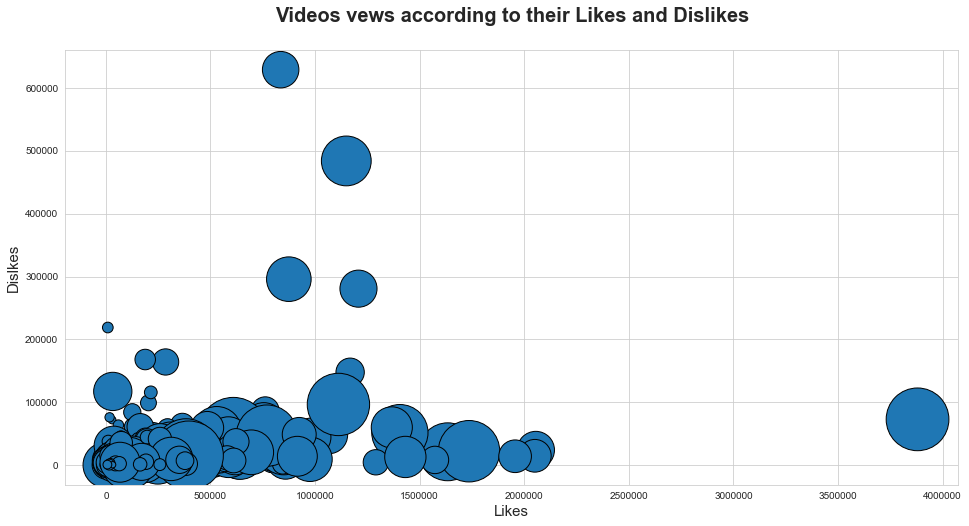

In [19]:
plt.figure(figsize=(16,8))
sns.set_style("whitegrid")
plt.title('Videos vews according to their Likes and Dislikes', fontsize=20, fontweight='bold', y=1.05,)
plt.xlabel('Likes', fontsize=15)
plt.ylabel('Dislkes', fontsize=15)

likes = us_videos_first["likes"].values
dislikes = us_videos_first["dislikes"].values
views = us_videos_first["views"].values

plt.scatter(likes, dislikes, s = views/10000, edgecolors='black')
plt.show()

### <a name="2.6"></a>2.6 The distrubution of LIKES & DISLIKES 

In [20]:
hist_data = [us_videos_first["dislikes_log"].values, us_videos_first["likes_log"].values]

group_labels = ['Dislikes log distribution', 'Likes log distribution']
colors = ['#A6ACEC', '#63F5EF']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, colors=colors,
                         bin_size=0.5, show_rug=False)

# Add title
fig['layout'].update(title='Likes vs dislikes', legend=dict(x=0.65, y=0.8))

# Plot!
py.iplot(fig, filename='Hist and Curve')

##### Let's look if the counts of Views, Likes, Dislikes,Comments is in normal distrubution

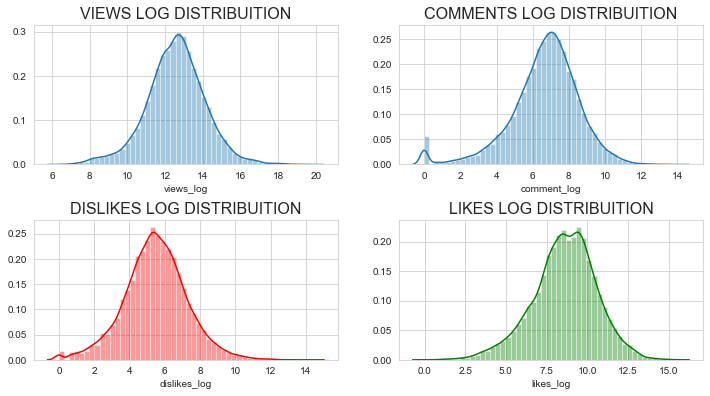

In [21]:
us_videos['likes_log'] = np.log(us_videos['likes'] + 1)
us_videos['views_log'] = np.log(us_videos['views'] + 1)
us_videos['dislikes_log'] = np.log(us_videos['dislikes'] + 1)
us_videos['comment_log'] = np.log(us_videos['comment_count'] + 1)

plt.figure(figsize = (12,6))

plt.subplot(221)
g1 = sns.distplot(us_videos['views_log'])
g1.set_title("VIEWS LOG DISTRIBUITION", fontsize=16)

plt.subplot(224)
g2 = sns.distplot(us_videos['likes_log'],color='green')
g2.set_title('LIKES LOG DISTRIBUITION', fontsize=16)

plt.subplot(223)
g3 = sns.distplot(us_videos['dislikes_log'], color='r')
g3.set_title("DISLIKES LOG DISTRIBUITION", fontsize=16)

plt.subplot(222)
g4 = sns.distplot(us_videos['comment_log'])
g4.set_title("COMMENTS LOG DISTRIBUITION", fontsize=16)

plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 0.9)

plt.show()

### <a name="2.7"></a>2.7 Correlation between dataset variables

In [22]:
us_videos.corr()


,category_id,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed,publish_hour,dislike_percentage,all_upper_in_title,likes_log,views_log,dislikes_log,comment_log
category_id,1.000000,-0.111990,-0.125314,-0.038864,-0.059847,0.044326,NaN,-0.018716,0.077335,0.084322,0.043635,-0.090729,-0.118624,-0.040933,-0.051853
views,-0.111990,1.000000,0.789153,0.472695,0.494368,-0.006550,NaN,0.009285,-0.038521,-0.013684,-0.014014,0.268865,0.344622,0.297720,0.224395
likes,-0.125314,0.789153,1.000000,0.516941,0.794809,-0.016561,NaN,0.012108,-0.020908,-0.076116,0.022467,0.411104,0.414589,0.387464,0.352953
dislikes,-0.038864,0.472695,0.516941,1.000000,0.632334,-0.001180,NaN,0.003235,-0.013076,0.090337,-0.005039,0.174920,0.204678,0.245201,0.171761
comment_count,-0.059847,0.494368,0.794809,0.632334,1.000000,-0.025675,NaN,0.003379,-0.000033,-0.017820,0.043155,0.318539,0.313601,0.327132,0.343034
comments_disabled,0.044326,-0.006550,-0.016561,-0.001180,-0.025675,1.000000,NaN,-0.003088,-0.030230,0.102369,-0.035628,-0.101021,-0.070658,-0.046366,-0.412056
ratings_disabled,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
video_error_or_removed,-0.018716,0.009285,0.012108,0.003235,0.003379,-0.003088,NaN,1.000000,0.000278,-0.003229,-0.010547,0.005766,0.011298,0.006894,-0.000738
publish_hour,0.077335,-0.038521,-0.020908,-0.013076,-0.000033,-0.030230,NaN,0.000278,1.000000,-0.039542,0.055417,0.041922,-0.026401,0.004389,0.055752
dislike_percentage,0.084322,-0.013684,-0.076116,0.090337,-0.017820,0.102369,NaN,-0.003229,-0.039542,1.000000,-0.080340,-0.378572,-0.076874,0.160769,-0.188263


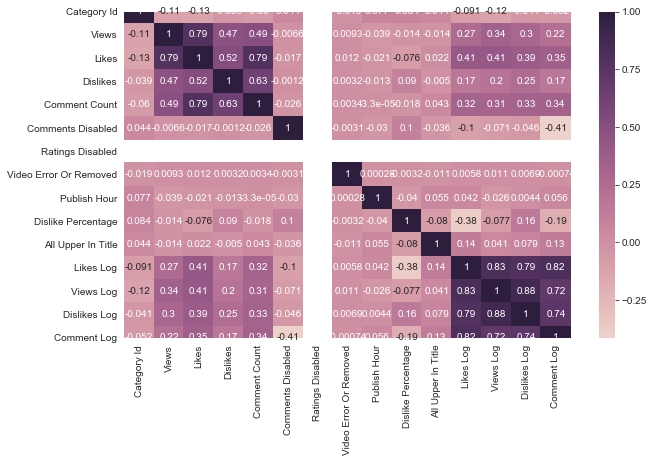

In [23]:
h_labels = [x.replace('_', ' ').title() for x in 
            list(us_videos.select_dtypes(include=['number', 'bool']).columns.values)]

fig, ax = plt.subplots(figsize=(10,6))
_ = sns.heatmap(us_videos.corr(),annot=True, xticklabels=h_labels, yticklabels=h_labels, cmap=sns.cubehelix_palette(as_cmap=True), ax=ax)

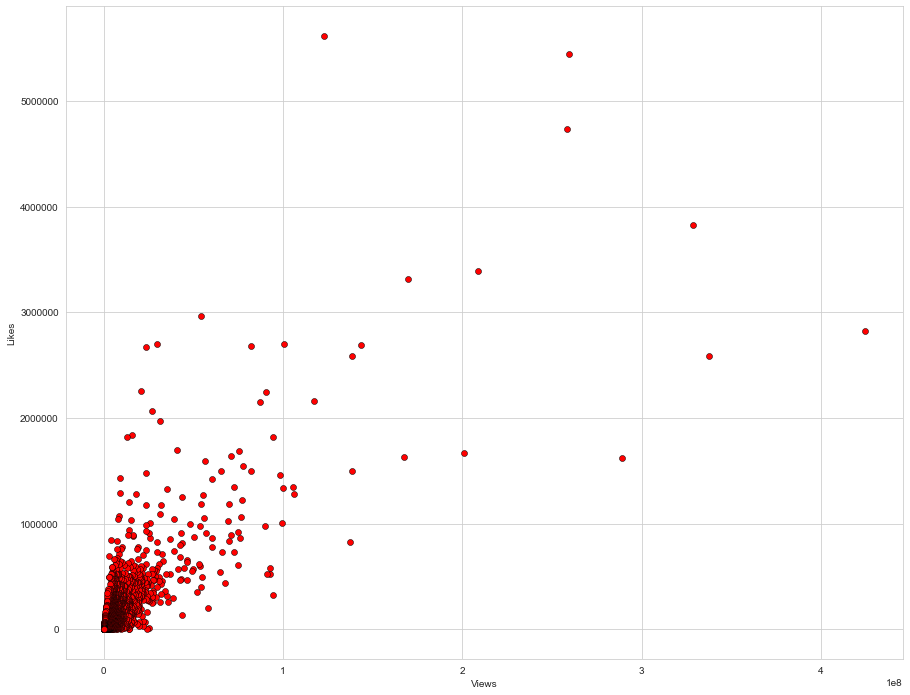

In [24]:
fig, ax = plt.subplots(figsize=(15,12))
_ = plt.scatter(x=us_videos['views'], y=us_videos['likes'], color='r', edgecolors="#000000", linewidths=0.5)
_ = ax.set(xlabel="Views", ylabel="Likes")

### <a name="2.8"></a>2.8 Most common words in video titles

In [25]:
title_words = list(us_videos["title"].apply(lambda x: x.split()))
title_words = [x for y in title_words for x in y]
Counter(title_words).most_common(25)


[('-', 9224),
 ('|', 8892),
 ('The', 3651),
 ('2018', 2557),
 ('the', 1905),
 ('Episode', 1854),
 ('&', 1625),
 ('to', 1501),
 ('in', 1358),
 ('of', 1332),
 ('and', 1263),
 ('on', 1087),
 ('A', 1083),
 ('a', 991),
 ('with', 928),
 ('To', 897),
 ('2017', 830),
 ('vs', 809),
 ('Full', 748),
 ('Game', 746),
 ('I', 735),
 ('2', 669),
 ('Trump', 660),
 ('With', 631),
 ('In', 613)]

In [26]:
print("Views quantiles")
print(us_videos['views'].quantile([.01,.25,.5,.75,.99]))
print("")
print("Likes quantiles")
print(us_videos['likes'].quantile([.01,.25,.5,.75,.99]))
print("")
print("Dislikes quantiles")
print(us_videos['dislikes'].quantile([.01,.25,.5,.75,.99]))
print("")
print("Comment quantiles")
print(us_videos['comment_count'].quantile([.01,.25,.5,.75,.99]))

Views quantiles
0.01        4055.52
0.25      113245.00
0.50      295812.00
0.75      748768.50
0.99    14180912.24
Name: views, dtype: float64

Likes quantiles
0.01        31.00
0.25      1726.50
0.50      6014.00
0.75     19593.50
0.99    388827.98
Name: likes, dtype: float64

Dislikes quantiles
0.01        2.00
0.25       80.00
0.50      235.00
0.75      704.00
0.99    20380.58
Name: dislikes, dtype: float64

Comment quantiles
0.01        0.00
0.25      300.00
0.50      945.00
0.75     2550.00
0.99    40894.94
Name: comment_count, dtype: float64


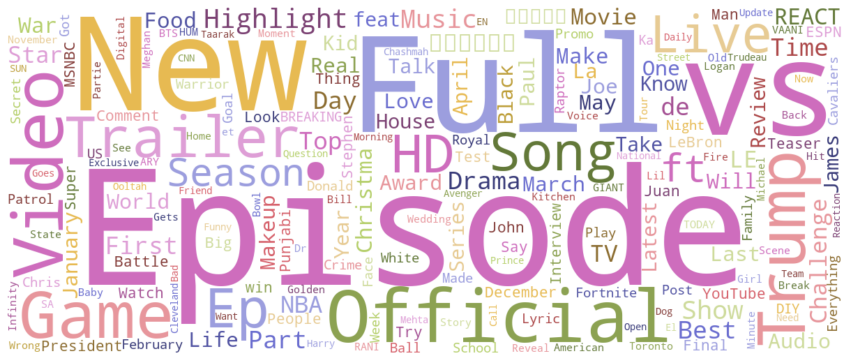

In [27]:
wc = WordCloud(width=1200, height=500, 
                         collocations=False, background_color="white", 
                         colormap="tab20b").generate(" ".join(title_words))
plt.figure(figsize=(15,10))
plt.imshow(wc, interpolation='bilinear')
_ = plt.axis("off")

### <a name="2.9"></a> 2.9 The popular channel

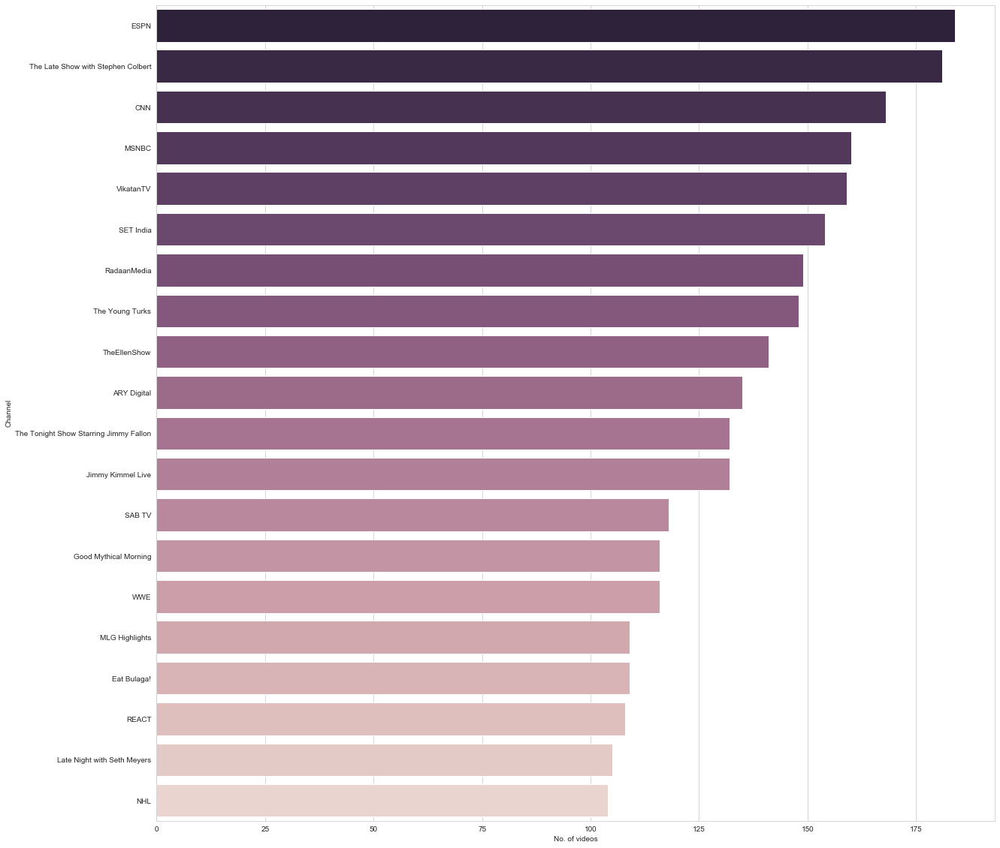

In [28]:
cdf = us_videos.groupby("channel_title").size().reset_index(name="video_count") \
    .sort_values("video_count", ascending=False).head(20)

fig, ax = plt.subplots(figsize=(20,20))
_ = sns.barplot(x="video_count", y="channel_title", data=cdf,
                palette=sns.cubehelix_palette(n_colors=20, reverse=True), ax=ax)
_ = ax.set(xlabel="No. of videos", ylabel="Channel")

### <a name="2.10"></a>2.10 The distrubution of videos from categories

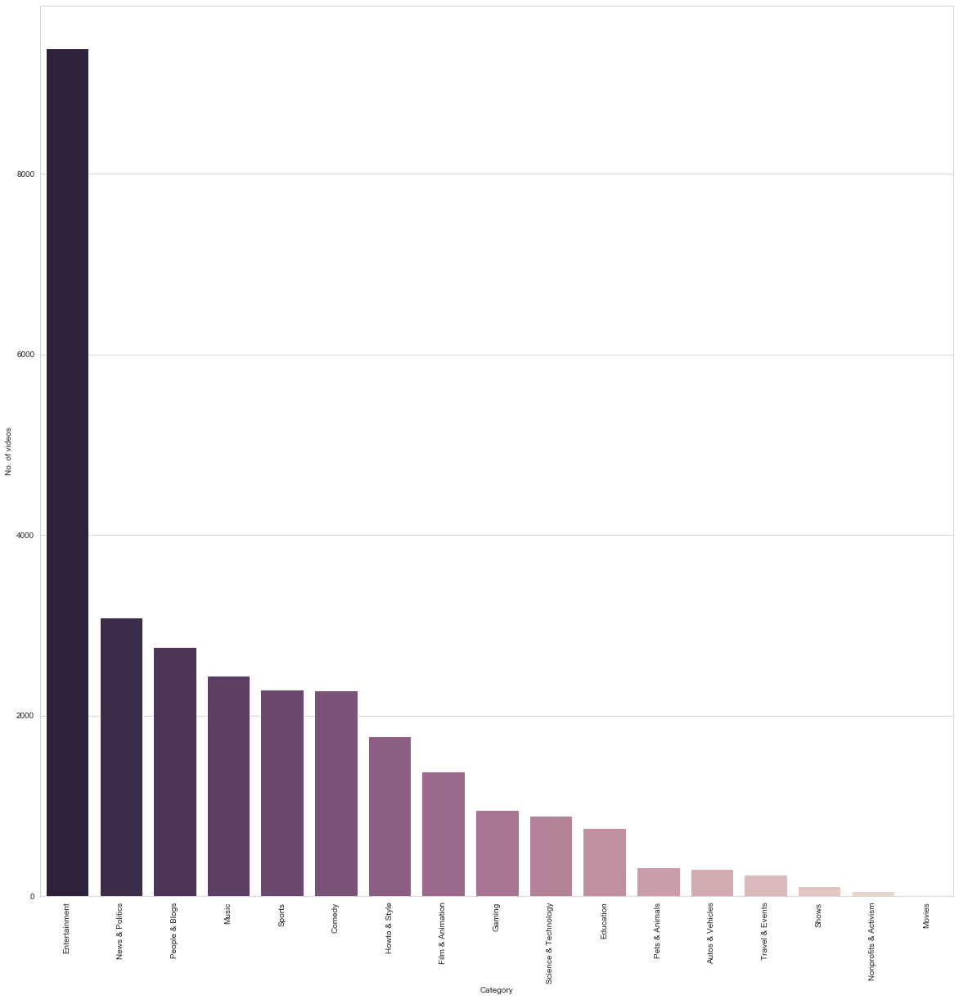

In [29]:
with open("US_category_id.json") as f:
    categories = json.load(f)["items"]
cat_dict = {}
for cat in categories:
    cat_dict[int(cat["id"])] = cat["snippet"]["title"]
us_videos['category_name'] = us_videos['category_id'].map(cat_dict)
cdf = us_videos["category_name"].value_counts().to_frame().reset_index()
cdf.rename(columns={"index": "category_name", "category_name": "No_of_videos"}, inplace=True)
fig, ax = plt.subplots(figsize=(20,20))
_ = sns.barplot(x="category_name", y="No_of_videos", data=cdf, 
                palette=sns.cubehelix_palette(n_colors=16, reverse=True), ax=ax)
_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
_ = ax.set(xlabel="Category", ylabel="No. of videos")

Category Name count
Entertainment      9389
News & Politics    3088
People & Blogs     2757
Music              2445
Sports             2292
Name: category_name, dtype: int64


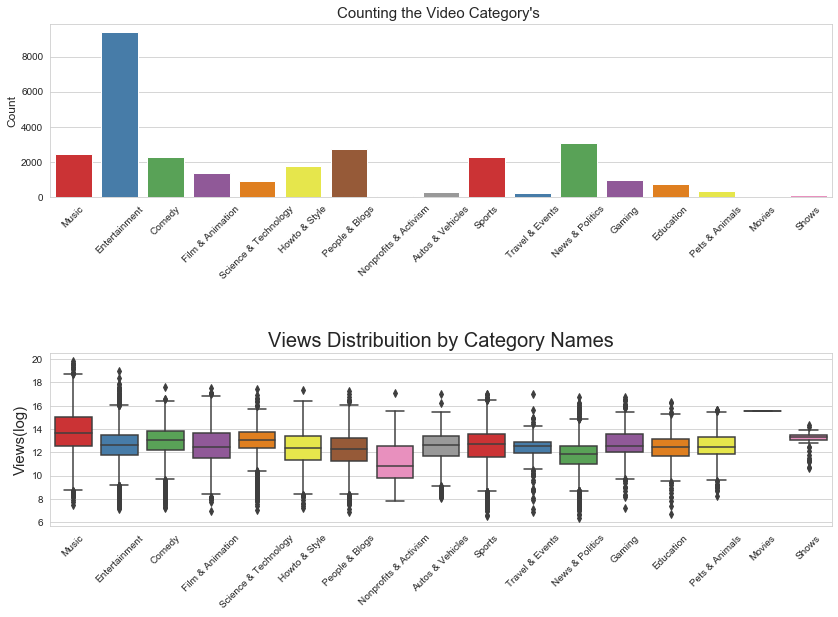

In [30]:
print("Category Name count")
print(us_videos.category_name.value_counts()[:5])

plt.figure(figsize = (14,9))

plt.subplot(211)
g = sns.countplot('category_name', data=us_videos, palette="Set1")
g.set_xticklabels(g.get_xticklabels(),rotation=45)
g.set_title("Counting the Video Category's ", fontsize=15)
g.set_xlabel("", fontsize=12)
g.set_ylabel("Count", fontsize=12)

plt.subplot(212)
g1 = sns.boxplot(x='category_name', y='views_log', data=us_videos, palette="Set1")
g1.set_xticklabels(g.get_xticklabels(),rotation=45)
g1.set_title("Views Distribuition by Category Names", fontsize=20)
g1.set_xlabel("", fontsize=15)
g1.set_ylabel("Views(log)", fontsize=15)

plt.subplots_adjust(hspace = 0.9, top = 0.9)

plt.show()

News and Politics have a the same of Non Profits of engagement likes

<h2>Looking the Views, likes, dislikes distribuition by category_name's</h2>

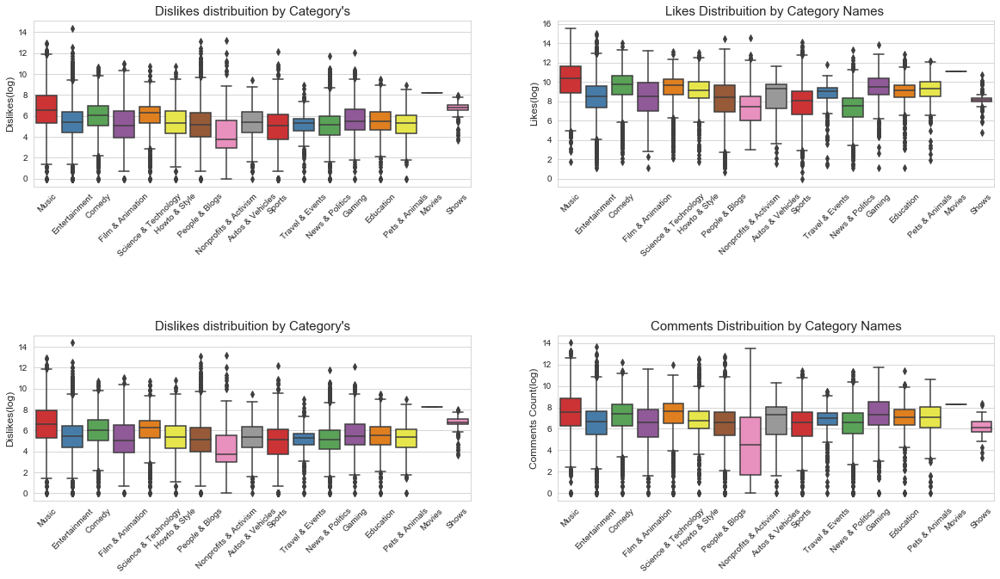

In [31]:
plt.figure(figsize = (20,10))
plt.subplot(221)
g = sns.boxplot(x='category_name', y='dislikes_log', data=us_videos, palette="Set1")
g.set_xticklabels(g.get_xticklabels(),rotation=45)
g.set_title("Dislikes distribuition by Category's", fontsize=15)
g.set_xlabel("", fontsize=12)
g.set_ylabel("Dislikes(log)", fontsize=12)

plt.subplot(222)
g1 = sns.boxplot(x='category_name', y='likes_log', data=us_videos, palette="Set1")
g1.set_xticklabels(g.get_xticklabels(),rotation=45)
g1.set_title("Likes Distribuition by Category Names ", fontsize=15)
g1.set_xlabel("", fontsize=12)
g1.set_ylabel("Likes(log)", fontsize=12)

plt.subplot(223)
g2 = sns.boxplot(x='category_name', y='dislikes_log', data=us_videos, palette="Set1")
g2.set_xticklabels(g.get_xticklabels(),rotation=45)
g2.set_title("Dislikes distribuition by Category's", fontsize=15)
g2.set_xlabel("", fontsize=12)
g2.set_ylabel("Dislikes(log)", fontsize=12)

plt.subplot(224)
g3 = sns.boxplot(x='category_name', y='comment_log', data=us_videos, palette="Set1")
g3.set_xticklabels(g.get_xticklabels(),rotation=45)
g3.set_title("Comments Distribuition by Category Names", fontsize=15)
g3.set_xlabel("", fontsize=12)
g3.set_ylabel("Comments Count(log)", fontsize=12)

plt.subplots_adjust(hspace = 0.9, top = 0.9)

plt.show()

### <a name="2.11"></a>2.11 Simple feature extraction from the number of Likes, Dislikes and Comments

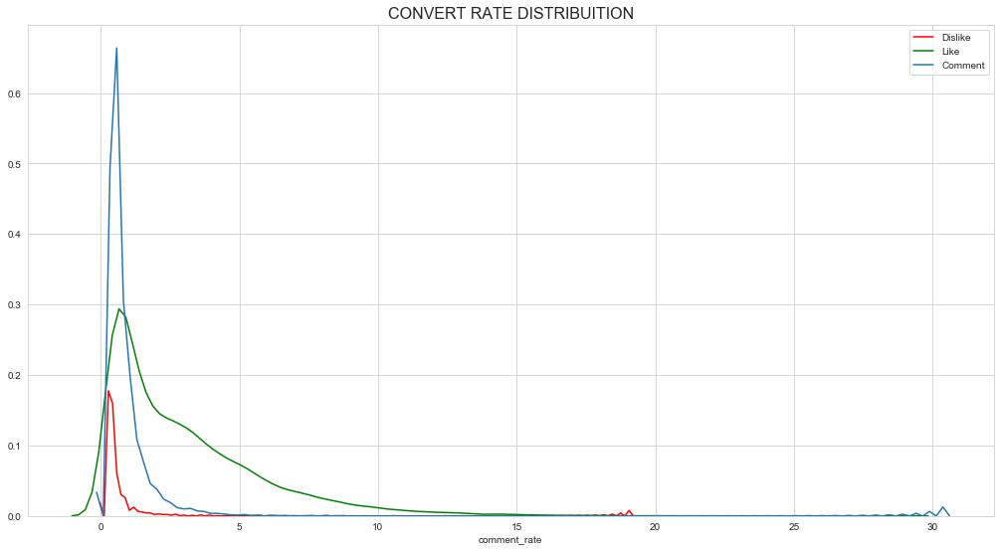

In [32]:
#create some new variables to us analyse the percent of likes, 
#dislikes, comment by each category to discover what category have the highest engagement
us_videos['like_rate'] =  us_videos ['likes'] / us_videos['views'] * 100
us_videos['dislike_rate'] =  us_videos ['dislikes'] / us_videos['views'] * 100
us_videos['comment_rate'] =  us_videos ['comment_count'] / us_videos['views'] * 100

plt.figure(figsize=(80,20))
plt.subplot(241)
g1 = sns.distplot(us_videos['dislike_rate'], color='red',hist=False, label="Dislike")
g1 = sns.distplot(us_videos['like_rate'], color='green',hist=False, label="Like")
g1 = sns.distplot(us_videos['comment_rate'],hist=False,label="Comment")
g1.set_title('CONVERT RATE DISTRIBUITION', fontsize=16)

plt.show()

There is some important information in our dataset. The Comment & Dislike are similarly distrubute. And then we need to have deeper research.

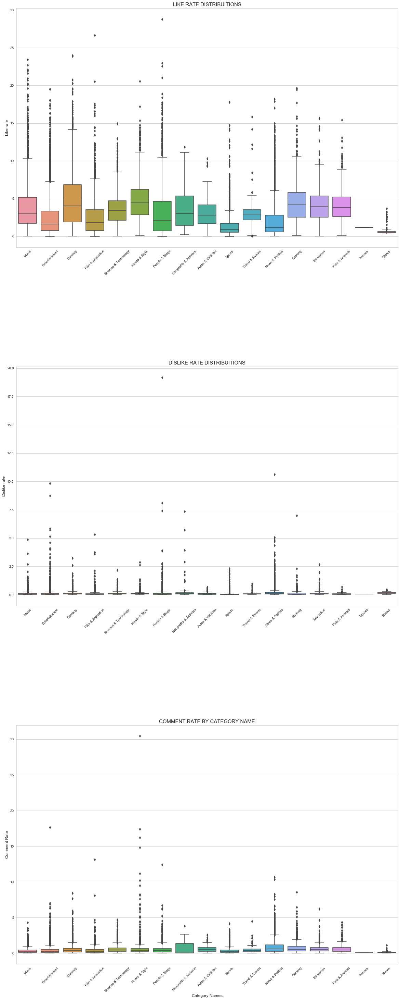

In [33]:
plt.figure(figsize = (20,50))

plt.subplot(311)
g= sns.boxplot(x='category_name',y='like_rate',  data=us_videos)
g.set_xticklabels(g.get_xticklabels(),rotation=45)
g.set_title("LIKE RATE DISTRIBUITIONS", fontsize=15)
g.set_xlabel("", fontsize=12)
g.set_ylabel("Like rate", fontsize=12)

plt.subplot(312)
g1= sns.boxplot(y='dislike_rate', x='category_name', data=us_videos)
g1.set_xticklabels(g.get_xticklabels(),rotation=45)
g1.set_title("DISLIKE RATE DISTRIBUITIONS", fontsize=15)
g1.set_xlabel("", fontsize=12)
g1.set_ylabel("Dislike rate", fontsize=12)

plt.subplot(313)
g2= sns.boxplot(y='comment_rate', x='category_name', data=us_videos)
g2.set_xticklabels(g.get_xticklabels(),rotation=45)
g2.set_title("COMMENT RATE BY CATEGORY NAME", fontsize=15)
g2.set_xlabel("Category Names", fontsize=12)
g2.set_ylabel("Comment Rate", fontsize=12)

plt.subplots_adjust(wspace = 0.2, hspace = 0.5,top = 0.9)

plt.show()

Some conclusions from the picture:
    We can see that the Dislike rate is very low in almost all categories but some outliers in 'People and Blogs' and News & Politics that we can might can consider "Normal"

The mean of ike distribuition is less than 5% but in music we have a very interesting pattern of like rate... The music category have the highest engagement rate.

And at the Comment rate we can see the how-to category with the highest rates of commments.

In [34]:
us_videos['category_name'] = np.nan

us_videos.loc[(us_videos["category_id"] == 1),"category_name"] = 'Film and Animation'
us_videos.loc[(us_videos["category_id"] == 2),"category_name"] = 'Cars and Vehicles'
us_videos.loc[(us_videos["category_id"] == 10),"category_name"] = 'Music'
us_videos.loc[(us_videos["category_id"] == 15),"category_name"] = 'Pets and Animals'
us_videos.loc[(us_videos["category_id"] == 17),"category_name"] = 'Sport'
us_videos.loc[(us_videos["category_id"] == 19),"category_name"] = 'Travel and Events'
us_videos.loc[(us_videos["category_id"] == 20),"category_name"] = 'Gaming'
us_videos.loc[(us_videos["category_id"] == 22),"category_name"] = 'People and Blogs'
us_videos.loc[(us_videos["category_id"] == 23),"category_name"] = 'Comedy'
us_videos.loc[(us_videos["category_id"] == 24),"category_name"] = 'Entertainment'
us_videos.loc[(us_videos["category_id"] == 25),"category_name"] = 'News and Politics'
us_videos.loc[(us_videos["category_id"] == 26),"category_name"] = 'How to and Style'
us_videos.loc[(us_videos["category_id"] == 27),"category_name"] = 'Education'
us_videos.loc[(us_videos["category_id"] == 28),"category_name"] = 'Science and Technology'
us_videos.loc[(us_videos["category_id"] == 29),"category_name"] = 'Non Profits and Activism'
us_videos.loc[(us_videos["category_id"] == 25),"category_name"] = 'News & Politics'

In [35]:
us_videos['like_rate'] =  us_videos ['likes'] / us_videos['views'] * 100
us_videos['dislike_rate'] =  us_videos ['dislikes'] / us_videos['views'] * 100
us_videos['comment_rate'] =  us_videos ['comment_count'] / us_videos['views'] * 100



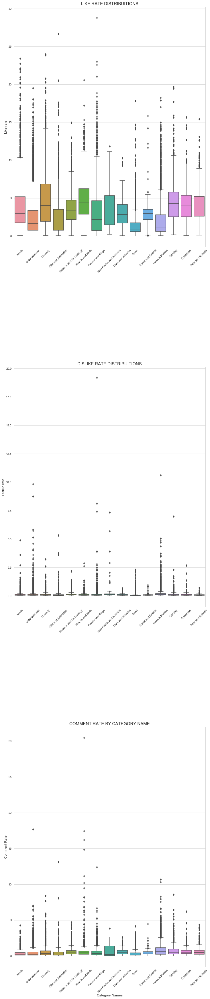

In [36]:
plt.figure(figsize = (12,60))

plt.subplot(311)
g= sns.boxplot(x='category_name',y='like_rate',  data=us_videos)
g.set_xticklabels(g.get_xticklabels(),rotation=45)
g.set_title("LIKE RATE DISTRIBUITIONS", fontsize=15)
g.set_xlabel("", fontsize=12)
g.set_ylabel("Like rate", fontsize=12)

plt.subplot(312)
g1= sns.boxplot(y='dislike_rate', x='category_name', data=us_videos)
g1.set_xticklabels(g.get_xticklabels(),rotation=45)
g1.set_title("DISLIKE RATE DISTRIBUITIONS", fontsize=15)
g1.set_xlabel("", fontsize=12)
g1.set_ylabel("Dislike rate", fontsize=12)

plt.subplot(313)
g2= sns.boxplot(y='comment_rate', x='category_name', data=us_videos)
g2.set_xticklabels(g.get_xticklabels(),rotation=45)
g2.set_title("COMMENT RATE BY CATEGORY NAME", fontsize=15)
g2.set_xlabel("Category Names", fontsize=12)
g2.set_ylabel("Comment Rate", fontsize=12)

plt.subplots_adjust(wspace = 0.2, hspace = 0.5,top = 0.9)

plt.show()

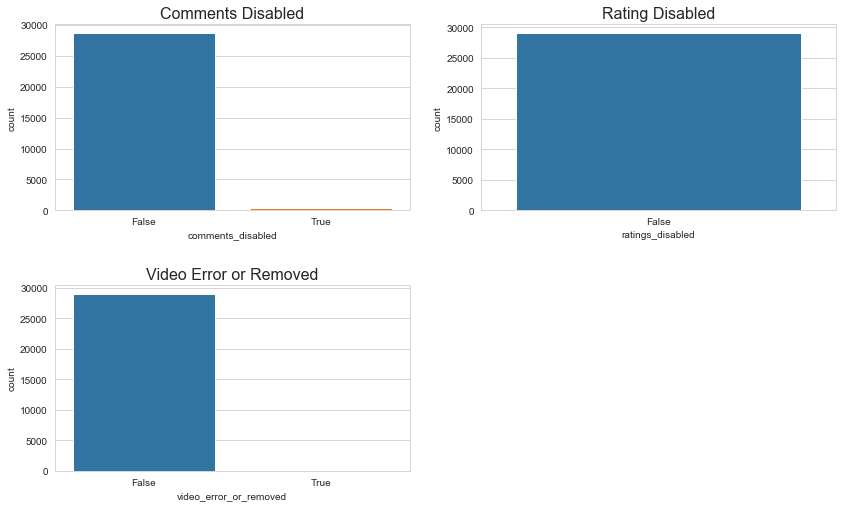

In [37]:
plt.figure(figsize = (14,8))
plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 0.9)

plt.subplot(2,2,1)
g = sns.countplot(x='comments_disabled', data=us_videos)
g.set_title("Comments Disabled", fontsize=16)

plt.subplot(2,2,2)
g1 = sns.countplot(x='ratings_disabled', data=us_videos)
g1.set_title("Rating Disabled", fontsize=16)

plt.subplot(2,2,3)
g2 = sns.countplot(x='video_error_or_removed', data=us_videos)
g2.set_title("Video Error or Removed", fontsize=16)
plt.show()

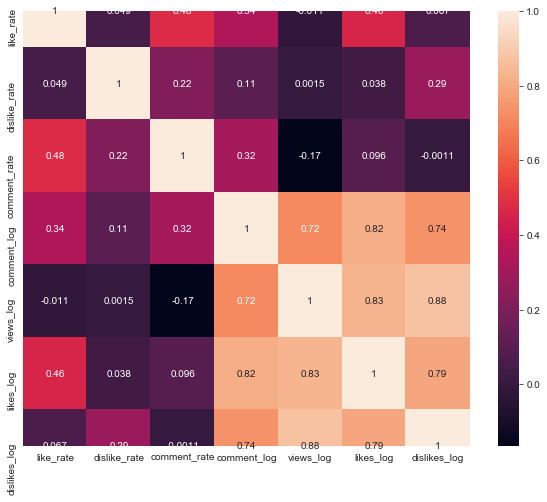

In [38]:
plt.figure(figsize = (10,8))

#Let's verify the correlation of each value
sns.heatmap(us_videos[['like_rate', 'dislike_rate', 'comment_rate', 'comment_log',
         'views_log','likes_log','dislikes_log', "category_name"]].corr(), annot=True)
plt.show()

## <a name="3"></a>3.Extract information from Tags & Description

### <a name="3.1"></a>3.1 Statistic & Preprocessing

In [39]:
#Setting the stopwords
eng_stopwords = set(stopwords.words("english"))

In [40]:
#Word count in each comment:
us_videos['count_word']=us_videos["title"].apply(lambda x: len(str(x).split()))
us_videos['count_word_tags']=us_videos["tags"].apply(lambda x: len(str(x).split()))

#Unique word count
us_videos['count_unique_word']=us_videos["title"].apply(lambda x: len(set(str(x).split())))
us_videos['count_unique_word_tags']=us_videos["tags"].apply(lambda x: len(set(str(x).split())))

#Letter count
us_videos['count_letters']=us_videos["title"].apply(lambda x: len(str(x)))
us_videos['count_letters_tags']=us_videos["tags"].apply(lambda x: len(str(x)))

#punctuation count
us_videos["count_punctuations"] =us_videos["title"].apply(lambda x: len([c for c in str(x) if c in string.punctuation]))
us_videos["count_punctuations_tags"] =us_videos["tags"].apply(lambda x: len([c for c in str(x) if c in string.punctuation]))

#upper case words count
us_videos["count_words_upper"] = us_videos["title"].apply(lambda x: len([w for w in str(x).split() if w.isupper()]))
us_videos["count_words_upper_tags"] = us_videos["tags"].apply(lambda x: len([w for w in str(x).split() if w.isupper()]))

#title case words count
us_videos["count_words_title"] = us_videos["title"].apply(lambda x: len([w for w in str(x).split() if w.istitle()]))
us_videos["count_words_title_tags"] = us_videos["tags"].apply(lambda x: len([w for w in str(x).split() if w.istitle()]))

#Number of stopwords
us_videos["count_stopwords"] = us_videos["title"].apply(lambda x: len([w for w in str(x).lower().split() if w in eng_stopwords]))
us_videos["count_stopwords_tags"] = us_videos["tags"].apply(lambda x: len([w for w in str(x).lower().split() if w in eng_stopwords]))

#Average length of the words
us_videos["mean_word_len"] = us_videos["title"].apply(lambda x: np.mean([len(w) for w in str(x).split()]))
us_videos["mean_word_len_tags"] = us_videos["tags"].apply(lambda x: np.mean([len(w) for w in str(x).split()]))

In [41]:
#derived features
#Word count percent in each comment:
us_videos['word_unique_percent']=us_videos['count_unique_word']*100/us_videos['count_word']
us_videos['word_unique_percent_tags']=us_videos['count_unique_word_tags']*100/us_videos['count_word_tags']

#Punct percent in each comment:
us_videos['punct_percent']=us_videos['count_punctuations']*100/us_videos['count_word']
us_videos['punct_percent_tags']=us_videos['count_punctuations_tags']*100/us_videos['count_word_tags']

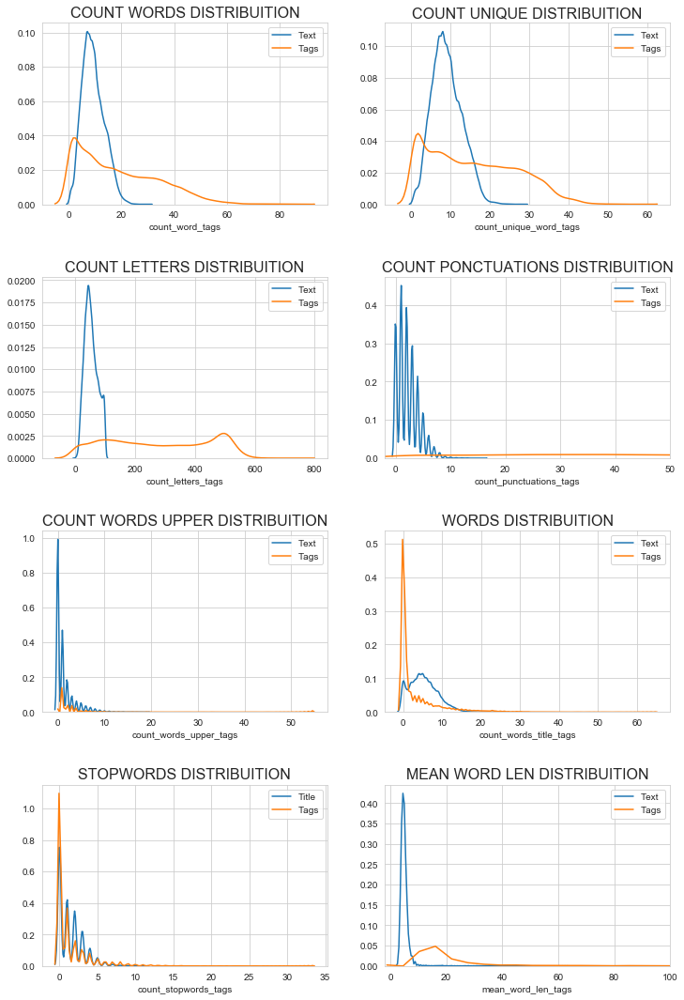

In [42]:
plt.figure(figsize = (12,18))

plt.subplot(421)
g1 = sns.distplot(us_videos['count_word'], 
                  hist=False, label='Text')
g1 = sns.distplot(us_videos['count_word_tags'], 
                  hist=False, label='Tags')
g1.set_title("COUNT WORDS DISTRIBUITION", fontsize=16)

plt.subplot(422)
g2 = sns.distplot(us_videos['count_unique_word'],
                  hist=False, label='Text')
g2 = sns.distplot(us_videos['count_unique_word_tags'], 
                  hist=False, label='Tags')
g2.set_title("COUNT UNIQUE DISTRIBUITION", fontsize=16)

plt.subplot(423)
g3 = sns.distplot(us_videos['count_letters'], 
                  hist=False, label='Text')
g3 = sns.distplot(us_videos['count_letters_tags'], 
                  hist=False, label='Tags')
g3.set_title("COUNT LETTERS DISTRIBUITION", fontsize=16)

plt.subplot(424)
g4 = sns.distplot(us_videos["count_punctuations"], 
                  hist=False, label='Text')
g4 = sns.distplot(us_videos["count_punctuations_tags"], 
                  hist=False, label='Tags')
g4.set_xlim([-2,50])
g4.set_title('COUNT PONCTUATIONS DISTRIBUITION', fontsize=16)

plt.subplot(425)
g5 = sns.distplot(us_videos["count_words_upper"] , 
                  hist=False, label='Text')
g5 = sns.distplot(us_videos["count_words_upper_tags"] , 
                  hist=False, label='Tags')
g5.set_title('COUNT WORDS UPPER DISTRIBUITION', fontsize=16)

plt.subplot(426)
g6 = sns.distplot(us_videos["count_words_title"], 
                  hist=False, label='Text')
g6 = sns.distplot(us_videos["count_words_title_tags"], 
                  hist=False, label='Tags')
g6.set_title('WORDS DISTRIBUITION', fontsize=16)

plt.subplot(427)
g7 = sns.distplot(us_videos["count_stopwords"], 
                  hist=False, label='Title')
g7 = sns.distplot(us_videos["count_stopwords_tags"], 
                  hist=False, label='Tags')
g7.set_title('STOPWORDS DISTRIBUITION', fontsize=16)

plt.subplot(428)
g8 = sns.distplot(us_videos["mean_word_len"], 
                  hist=False, label='Text')
g8 = sns.distplot(us_videos["mean_word_len_tags"], 
                  hist=False, label='Tags')
g8.set_xlim([-2,100])
g8.set_title('MEAN WORD LEN DISTRIBUITION', fontsize=16)

plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 0.9)
plt.legend()
plt.show()

### <a name="3.2"></a>3.2 The relationship between information from tag & description and the number of likes,dislikes,views and comments

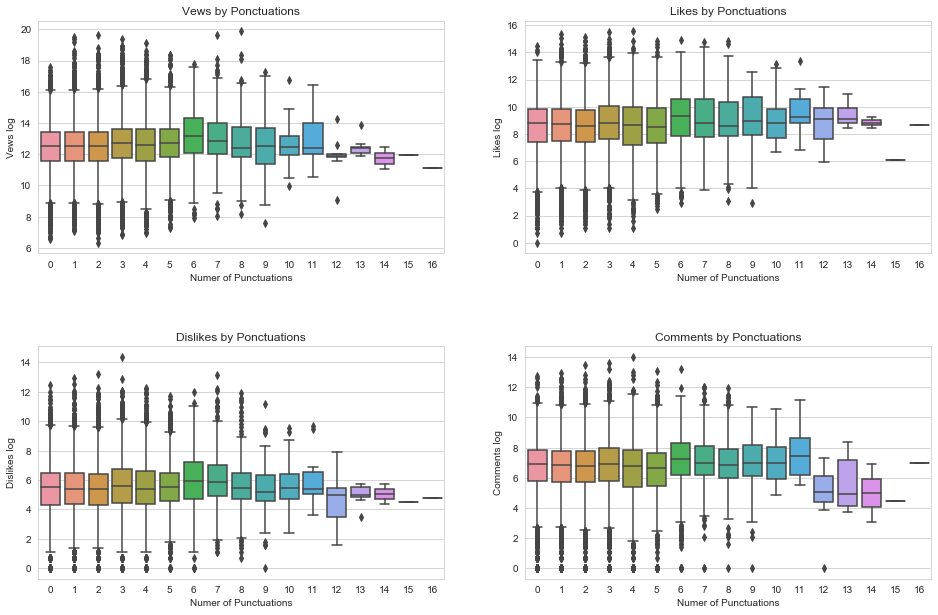

In [43]:
plt.figure(figsize = (16,10))

plt.subplot(221)
g=sns.boxplot(x='count_punctuations', y='views_log',data=us_videos)
g.set_title("Vews by Ponctuations")
g.set_xlabel("Numer of Punctuations")
g.set_ylabel("Vews log")

plt.subplot(222)
g1 = sns.boxplot(x='count_punctuations', y='likes_log',data=us_videos)
g1.set_title("Likes by Ponctuations")
g1.set_xlabel("Numer of Punctuations")
g1.set_ylabel("Likes log")

plt.subplot(223)
g2 = sns.boxplot(x='count_punctuations', y='dislikes_log',data=us_videos)
g2.set_title("Dislikes by Ponctuations")
g2.set_xlabel("Numer of Punctuations")
g2.set_ylabel("Dislikes log")

plt.subplot(224)
g3 = sns.boxplot(x='count_punctuations', y='comment_log',data=us_videos)
g3.set_title("Comments by Ponctuations")
g3.set_xlabel("Numer of Punctuations")
g3.set_ylabel("Comments log")

plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 0.9)

plt.show()

### <a name="3.3"></a>3.3 The statstics of puncuation value

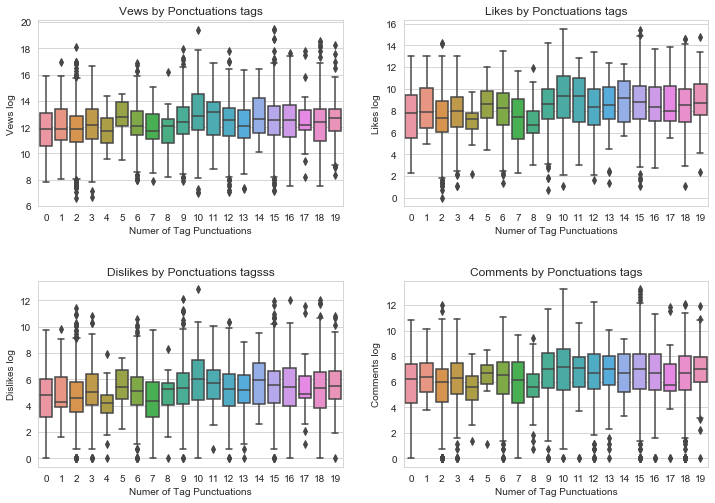

In [44]:
plt.figure(figsize = (12,8))

plt.subplot(221)
g=sns.boxplot(x='count_punctuations_tags', y='views_log',data=us_videos[us_videos['count_punctuations_tags'] < 20])
g.set_title("Vews by Ponctuations tags")
g.set_xlabel("Numer of Tag Punctuations")
g.set_ylabel("Vews log")

plt.subplot(222)
g1 = sns.boxplot(x='count_punctuations_tags', y='likes_log',data=us_videos[us_videos['count_punctuations_tags'] < 20])
g1.set_title("Likes by Ponctuations tags")
g1.set_xlabel("Numer of Tag Punctuations")
g1.set_ylabel("Likes log")

plt.subplot(223)
g2 = sns.boxplot(x='count_punctuations_tags', y='dislikes_log',data=us_videos[us_videos['count_punctuations_tags'] < 20])
g2.set_title("Dislikes by Ponctuations tagsss")
g2.set_xlabel("Numer of Tag Punctuations")
g2.set_ylabel("Dislikes log")

plt.subplot(224)
g3 = sns.boxplot(x='count_punctuations_tags', y='comment_log',data=us_videos[us_videos['count_punctuations_tags'] < 20])
g3.set_title("Comments by Ponctuations tags")
g3.set_xlabel("Numer of Tag Punctuations")
g3.set_ylabel("Comments log")

plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 0.9)

plt.show()

### <a name="3.4"></a>3.4 The correlation between the text and number of views

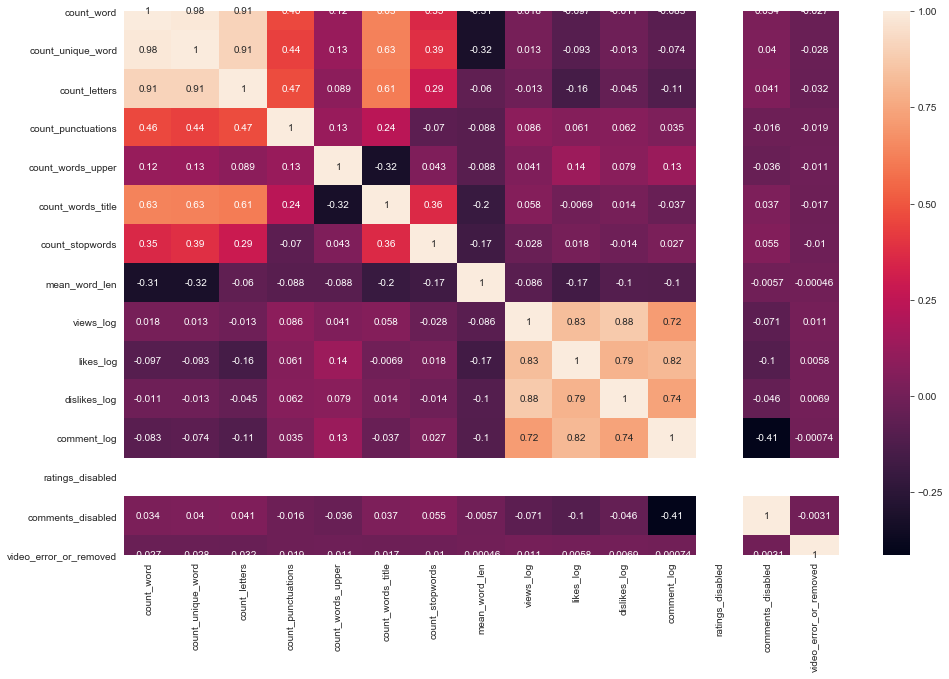

In [45]:
plt.figure(figsize = (16,10))

sns.heatmap(us_videos[['count_word', 'count_unique_word','count_letters',
                     "count_punctuations","count_words_upper", "count_words_title", 
                     "count_stopwords","mean_word_len", 
                     'views_log', 'likes_log','dislikes_log','comment_log',
                     'ratings_disabled', 'comments_disabled', 'video_error_or_removed']].corr(), annot=True)
plt.show()

### <a name="3.5"></a>3.5 The visualization of titles, tags and descriptions by WordCloud

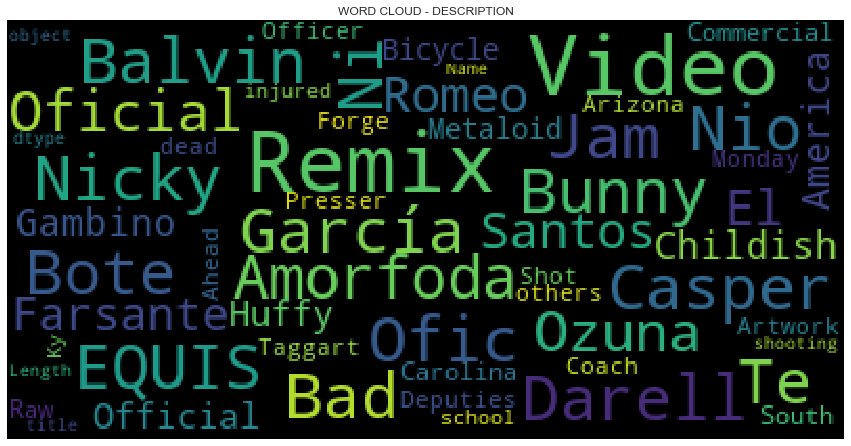

In [46]:
plt.figure(figsize = (15,15))

stopwords = set(STOPWORDS)
wordcloud = WordCloud(
                          background_color='black',
                          stopwords=stopwords,
                          max_words=150,
                          max_font_size=40, 
                          random_state=42
                         ).generate(str(us_videos['title']))

print(wordcloud)
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.title("WORD CLOUD - DESCRIPTION")
plt.axis('off')
plt.show()


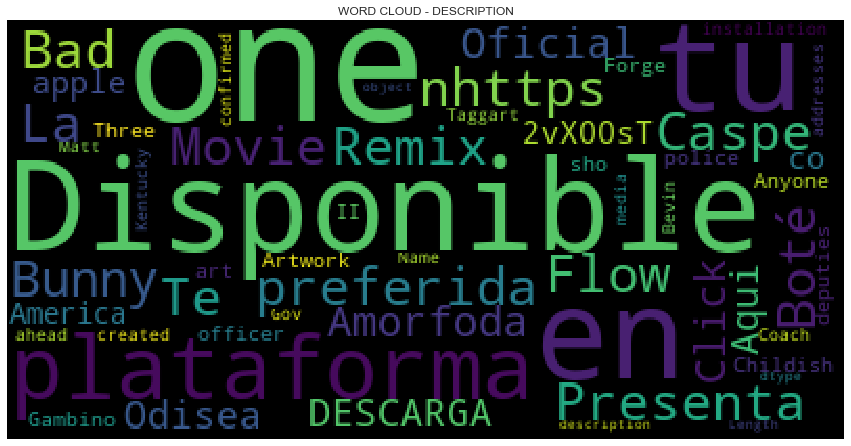

In [47]:
plt.figure(figsize = (15,15))

stopwords = set(STOPWORDS)

newStopWords= ['https', 'youtube', 'VIDEO','youtu','CHANNEL', 'WATCH']

stopwords.update(newStopWords)

wordcloud = WordCloud(
                          background_color='black',
                          stopwords=stopwords,
                          max_words=1200,
                          max_font_size=80, 
                          random_state=42
                         ).generate(str(us_videos['description']))

print(wordcloud)
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.title("WORD CLOUD - DESCRIPTION")
plt.axis('off')
plt.show()


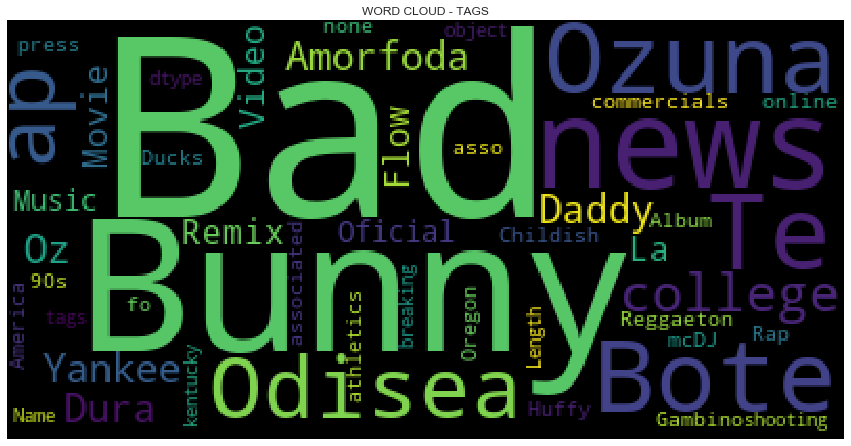

In [48]:
plt.figure(figsize = (15,15))

stopwords = set(STOPWORDS)
wordcloud = WordCloud(
                          background_color='black',
                          stopwords=stopwords,
                          max_words=1200,
                          max_font_size=120, 
                          random_state=42
                         ).generate(str(us_videos['tags']))
print(wordcloud)
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.title("WORD CLOUD - TAGS")
plt.axis('off')
plt.show()

In [49]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error
import statsmodels.api as sm

j4KvrAUjn6c    30
iILJvqrAQ_w    29
r-3iathMo7o    29
QBL8IRJ5yHU    29
NBSAQenU2Bk    29
               ..
0lbJHqAGpbA     1
6lI67K54qgQ     1
1HJkmKODN4Y     1
H79dKmgzcJU     1
wKbFHK05Jks     1
Name: video_id, Length: 6351, dtype: int64
2018-05-18T14:00:04.000Z    50
2018-05-06T13:00:05.000Z    32
2018-05-13T18:03:56.000Z    30
2018-05-14T14:00:03.000Z    29
2018-05-09T17:00:00.000Z    29
                            ..
2018-02-01T17:00:05.000Z     1
2017-11-09T02:21:31.000Z     1
2018-01-06T05:00:01.000Z     1
2018-01-22T11:17:25.000Z     1
2017-11-14T14:00:32.000Z     1
Name: publish_time, Length: 6269, dtype: int64


,likes,dislikes,views,comment_count
publish_year,,,,
2017,47935.029824,2991.047277,1.313908e+06,5780.985232
2018,83925.168533,3988.920374,2.739773e+06,9431.740117


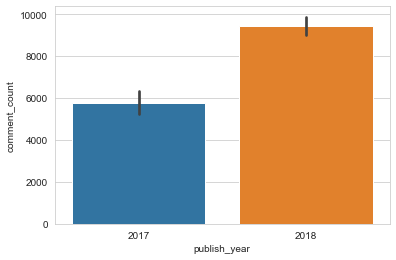

In [50]:
US_video=pd.read_csv("USvideos.csv")
print(US_video["video_id"].value_counts())
print(US_video["publish_time"].value_counts())
US_video["publish_time"]=pd.to_datetime(US_video["publish_time"])
US_video=US_video.assign(publish_day=US_video.publish_time.dt.day,
                        publish_month=US_video.publish_time.dt.month,
                         publish_year=US_video.publish_time.dt.year)

US_video.drop(US_video[US_video["publish_year"]<2017].index,inplace=True)
sns.barplot(x=US_video["publish_year"],y=US_video["comment_count"])
US_video.groupby("publish_year")["likes","dislikes","views","comment_count"].mean()

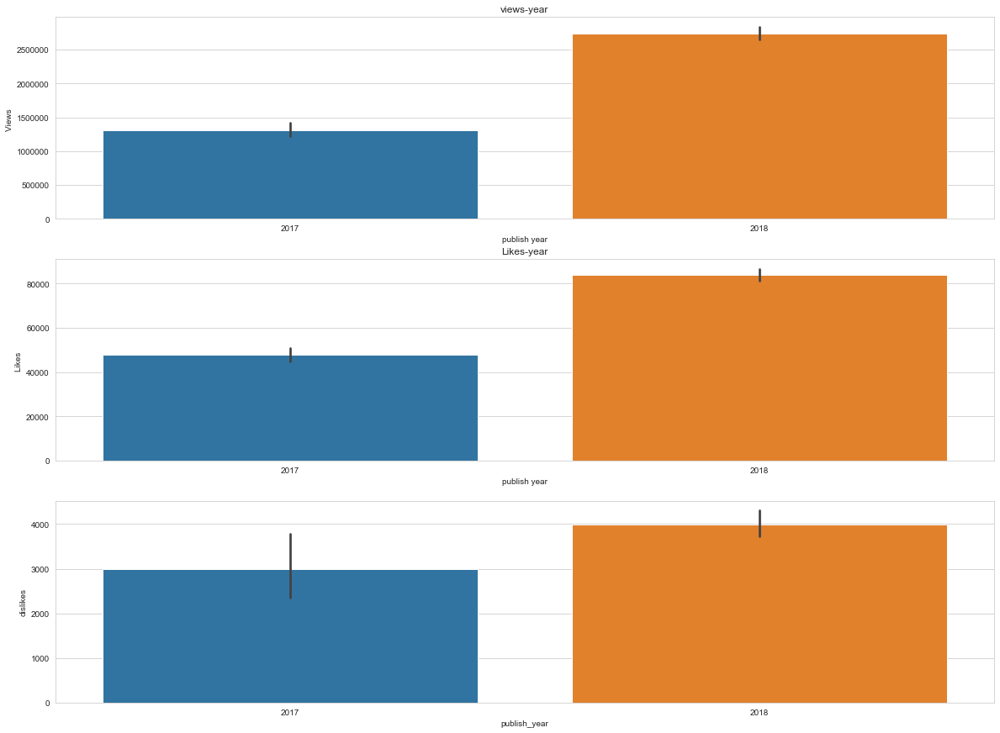

In [51]:
plt.figure(figsize=(20,15));
plt.subplot(311)
g1 = sns.barplot(x=US_video["publish_year"],y=US_video["views"])
g1.set_title("views-year")
g1.set_xlabel("publish year")
g1.set_ylabel("Views ")
plt.subplot(312)
g2=sns.barplot(x=US_video["publish_year"],y=US_video["likes"])
g2.set_title("Likes-year")
g2.set_xlabel("publish year")
g2.set_ylabel("Likes ")
plt.subplot(313)
sns.barplot(x=US_video["publish_year"],y=US_video["dislikes"])
g3.set_title("Dislikes-year")
g3.set_xlabel("publish year")
g3.set_ylabel("Dislikes ")


plt.show()

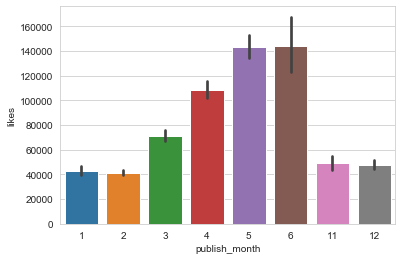

In [52]:
sns.countplot(x=US_video["publish_month"],data=US_video)
US_video.drop(US_video[(US_video["publish_month"]<11) & (US_video["publish_month"]>7)].index,inplace=True)
sns.barplot(x=US_video["publish_month"],y=US_video["likes"])


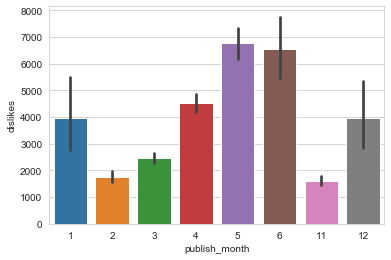

In [53]:
sns.barplot(x=US_video["publish_month"],y=US_video["dislikes"])


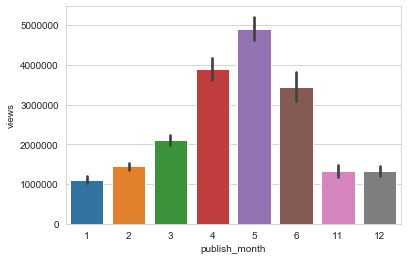

In [54]:
sns.barplot(x=US_video["publish_month"],y=US_video["views"])

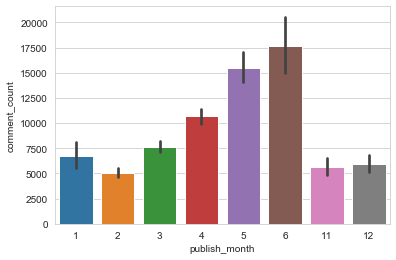

In [55]:
sns.barplot(x=US_video["publish_month"],y=US_video["comment_count"])

In [56]:
print(US_video["trending_date"].value_counts())
US_video["trending_date"]=pd.to_datetime(US_video["trending_date"],format="%y.%d.%m")
US_video=US_video.assign(trending_day=US_video.trending_date.dt.day,trending_month=US_video.trending_date.dt.month,trending_year=US_video.trending_date.dt.year)

18.11.05    200
18.14.06    200
18.24.04    200
17.13.12    200
18.10.02    200
           ... 
17.25.11    191
18.04.01    191
18.01.01    191
17.26.11    190
17.27.11    188
Name: trending_date, Length: 205, dtype: int64


### 3.6. Sentiment Recognization

In [57]:
from textblob import TextBlob

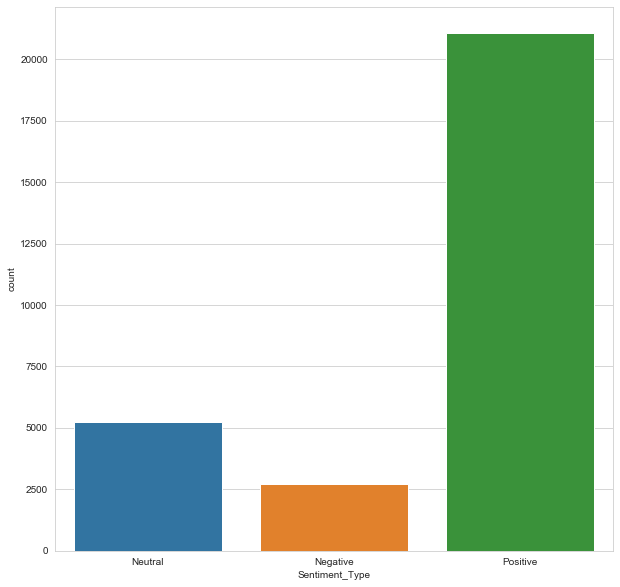

In [58]:
bloblist_desc = list()

df_usa_descr_str=us_videos['description'].astype(str)
for row in df_usa_descr_str:
    blob = TextBlob(row)
    bloblist_desc.append((row,blob.sentiment.polarity, blob.sentiment.subjectivity))
    df_usa_polarity_desc = pd.DataFrame(bloblist_desc, columns = ['sentence','sentiment','polarity'])
 
def f(df_usa_polarity_desc):
    if df_usa_polarity_desc['sentiment'] > 0:
        val = "Positive"
    elif df_usa_polarity_desc['sentiment'] == 0:
        val = "Neutral"
    else:
        val = "Negative"
    return val

df_usa_polarity_desc['Sentiment_Type'] = df_usa_polarity_desc.apply(f, axis=1)

plt.figure(figsize=(10,10))
sns.set_style("whitegrid")

ax = sns.countplot(x="Sentiment_Type", data=df_usa_polarity_desc)


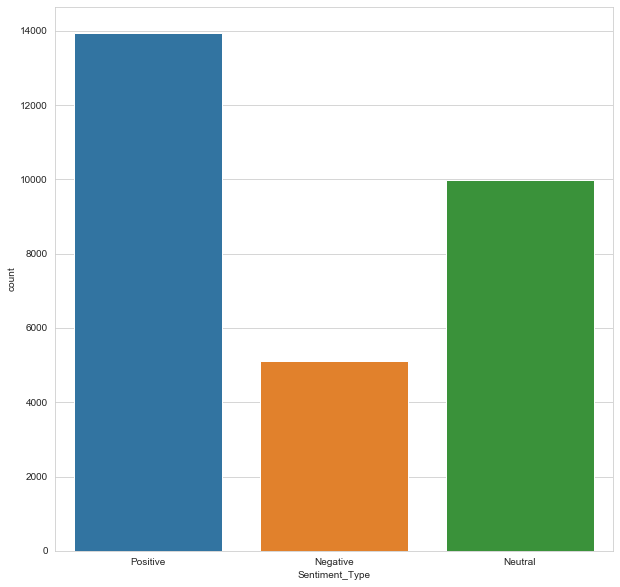

In [59]:
bloblist_tags = list()

df_usa_tags_str=us_videos['tags']
for row in df_usa_tags_str:
    blob = TextBlob(row)
    bloblist_tags.append((row,blob.sentiment.polarity, blob.sentiment.subjectivity))
    df_usa_polarity_tags = pd.DataFrame(bloblist_tags, columns = ['sentence','sentiment','polarity'])
 
def f_tags(df_usa_polarity_tags):
    if df_usa_polarity_tags['sentiment'] > 0:
        val = "Positive"
    elif df_usa_polarity_tags['sentiment'] == 0:
        val = "Neutral"
    else:
        val = "Negative"
    return val

df_usa_polarity_tags['Sentiment_Type'] = df_usa_polarity_tags.apply(f_tags, axis=1)

plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.countplot(x="Sentiment_Type", data=df_usa_polarity_tags)

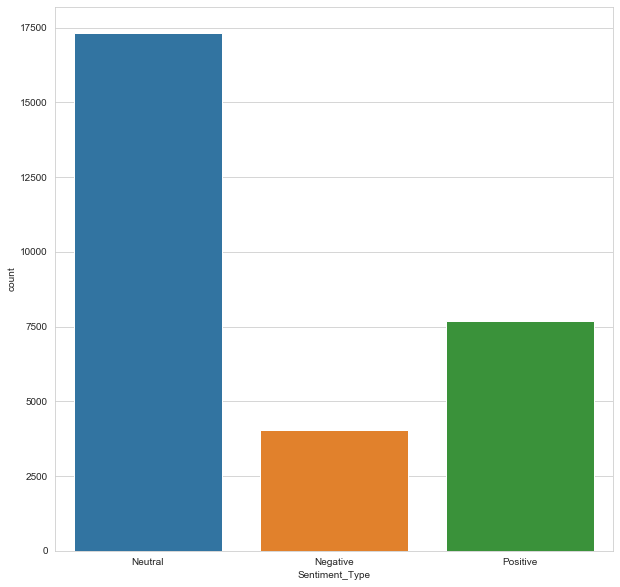

In [60]:
bloblist_title = list()

df_usa_title_str=us_videos['title']
for row in df_usa_title_str:
    blob = TextBlob(row)
    bloblist_title.append((row,blob.sentiment.polarity, blob.sentiment.subjectivity))
    df_usa_polarity_title = pd.DataFrame(bloblist_title, columns = ['sentence','sentiment','polarity'])
 
def f_title(df_usa_polarity_title):
    if df_usa_polarity_title['sentiment'] > 0:
        val = "Positive"
    elif df_usa_polarity_title['sentiment'] == 0:
        val = "Neutral"
    else:
        val = "Negative"
    return val

df_usa_polarity_title['Sentiment_Type'] = df_usa_polarity_title.apply(f_title, axis=1)

plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.countplot(x="Sentiment_Type", data=df_usa_polarity_title)

## <a name="4"></a>4. Machine Learning Model


### <a name="4.1"></a>4.1 Preprocessing

<h4>Functions for data description, getting a view of data. </h4>

In [61]:
# description
def data_descr(data):
    print("features: \n", data.columns)
    print(data.head(10))

# heatmap
def heatmap(df):
    plt.figure(figsize=(8, 8))
    mask = np.zeros_like(df.corr())
    mask[np.triu_indices_from(mask)] = True
    with sns.axes_style("white"):
        ax = sns.heatmap(df.corr().round(2), mask=mask,
                         cmap='coolwarm', square=True, annot=True)
    plt.show() 

<h4> Reconstruction of dataset. </h4>

In [62]:
#read data
data_us = pd.read_csv('USvideos.csv')

# new DataFrame for further procession
#modify dataset
data1 = data_us.drop(['title','channel_title', 'tags', 'thumbnail_link', 'description'], axis=1)
data_descr(data1)

data1['likes_log'] = np.log(data_us['likes'] + 1)
data1['views_log'] = np.log(data_us['views'] + 1)
data1['dislikes_log'] = np.log(data_us['dislikes'] + 1)
data1['comment_log'] = np.log(data_us['comment_count'] + 1)

data_descr(data_us)

features: 
 Index(['video_id', 'trending_date', 'category_id', 'publish_time', 'views',
       'likes', 'dislikes', 'comment_count', 'comments_disabled',
       'ratings_disabled', 'video_error_or_removed'],
      dtype='object')
      video_id trending_date  category_id              publish_time    views  \
0  2kyS6SvSYSE      17.14.11           22  2017-11-13T17:13:01.000Z   748374   
1  1ZAPwfrtAFY      17.14.11           24  2017-11-13T07:30:00.000Z  2418783   
2  5qpjK5DgCt4      17.14.11           23  2017-11-12T19:05:24.000Z  3191434   
3  puqaWrEC7tY      17.14.11           24  2017-11-13T11:00:04.000Z   343168   
4  d380meD0W0M      17.14.11           24  2017-11-12T18:01:41.000Z  2095731   
5  gHZ1Qz0KiKM      17.14.11           28  2017-11-13T19:07:23.000Z   119180   
6  39idVpFF7NQ      17.14.11           24  2017-11-12T05:37:17.000Z  2103417   
7  nc99ccSXST0      17.14.11           28  2017-11-12T21:50:37.000Z   817732   
8  jr9QtXwC9vc      17.14.11            1  2017-11

<h4>Duplicated data exists. </h4>

In [63]:
# # trending video's overlap counts
# dupli = data1.video_id.duplicated()
# print("trending video's overlap count: \n", dupli.value_counts())
# # plot for duplicated
# dupli.plot(kind='bar', title='duplicated video')
# plt.show()

<h4>Transfer data type from string to datetime, then calculate. </h4>

In [64]:
# to_datetime: trending_date, publish_time
data1['trending_date'] = pd.to_datetime(data1['trending_date'], format='%y.%d.%m').dt.date
publish_time = pd.to_datetime(data1['publish_time'], format='%Y-%m-%dT%H:%M:%S.%fZ')
data1.insert(loc=3, column='publish_date', value=publish_time.dt.date)
data1['publish_time'] = publish_time.dt.time
data1.insert(loc=5, column='publish_hour', value=publish_time.dt.hour)

data1['interval_to_trend'] = (data1['trending_date'] - data1['publish_date']).dt.days

data1 = data1.sort_values(by=['video_id'])

<h4>Plot for likes, dislikes, comment_counts and views</h4>

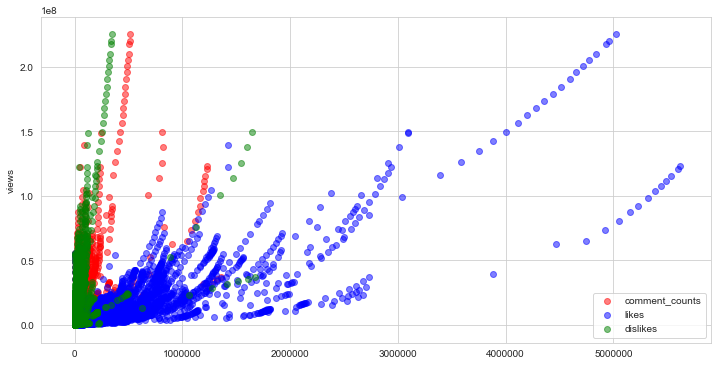

In [65]:
X_likes = data1['likes']
X_dislikes = data1['dislikes']
X_comments = data1['comment_count']
Y = data1['views']

plt.figure(figsize=(12,6))
plt.scatter(X_comments, Y, c='r', label='comment_counts', alpha=0.5)
plt.scatter(X_likes, Y, c='b', label='likes', alpha=0.5)
plt.scatter(X_dislikes, Y, c='g', label='dislikes', alpha=0.5)
plt.ylabel('views')
plt.legend()
plt.show()

<b>Split the dataset and setup related parameters</b>

### <a name="4.2"></a>4.2 Predicting views

#### <a name="4.2"></a>4.2.1. Polynomial regression

In [67]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import Imputer
data_prdc = data1.drop(['views','video_id', 'trending_date','publish_date',
                          'publish_time', 'publish_hour'], axis=1)
views = data1['views']
#split

X_train, X_test, Y_train, Y_test = train_test_split(data_prdc, views, random_state=1)
X_train = Imputer().fit_transform(X_train)
#Polynomial Regression


poly_features = PolynomialFeatures(degree=2, include_bias=False)
ploy = poly_features.fit_transform(X_train)

model = LinearRegression()
model.fit(ploy, Y_train)

/Users/harold/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:66: DeprecationWarning:

Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.



LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

<h4>Predict and plot, then calculating the score with R2 score </h4>

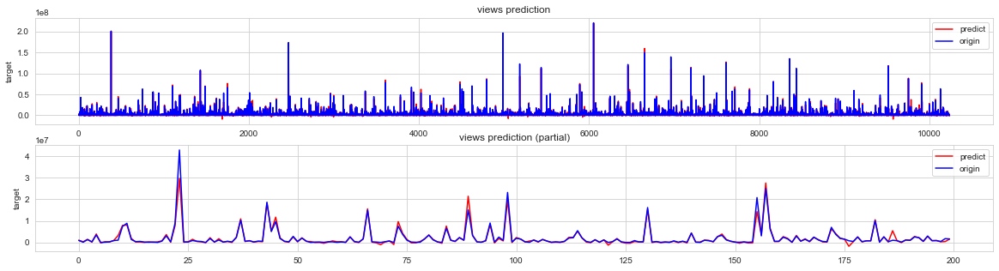

R squared =  0.9832832383481533


In [68]:
#predict
predict = model.predict(poly_features.transform(X_test))

#plot
plt.figure(figsize=(20, 5))
plt.subplot(2,1,1)
plt.plot(range(predict.shape[0]), predict, color='r', label = 'predict')
plt.plot(range(Y_test.shape[0]), Y_test, color='b', label = 'origin')
plt.title('views prediction')
plt.ylabel('target')
plt.legend()

plt.subplot(2,1,2)
plt.plot(range(predict.shape[0])[:200], predict[:200], color='r', label = 'predict')
plt.plot(range(Y_test.shape[0])[:200], Y_test[:200], color='b', label = 'origin')
plt.title('views prediction (partial)')
plt.ylabel('target')
plt.legend()

plt.show()

#score
from sklearn.metrics import r2_score
r2 = r2_score(Y_test, predict)
print("R squared = ", r2)

#### <a name="4.2.2"></a>4.2.2 Linear Regression

Root means score 3244254.506830699
Variance score: 0.83
Result : 0.8348833849013891


/Users/harold/anaconda3/lib/python3.7/site-packages/seaborn/regression.py:546: UserWarning:

The `size` paramter has been renamed to `height`; please update your code.



<function print>

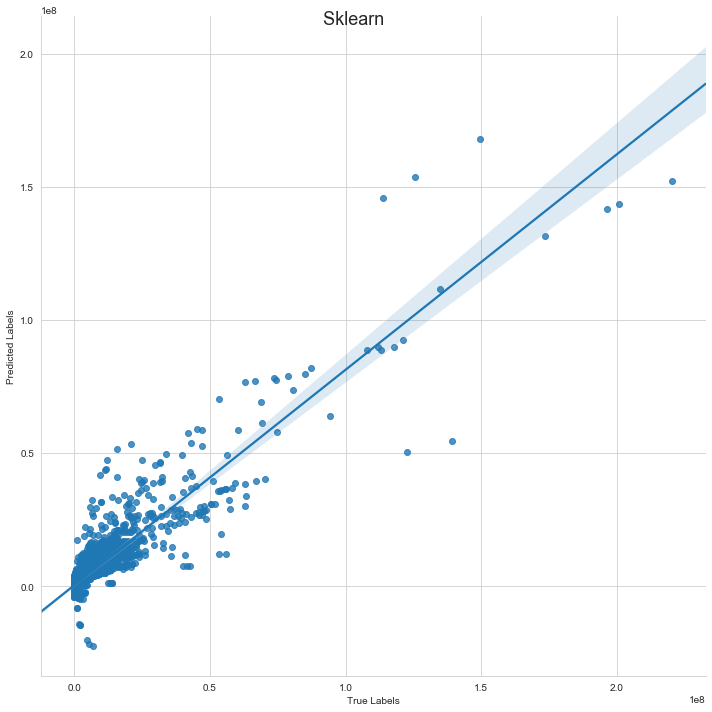

In [69]:
model = LinearRegression()
model.fit(X_train, Y_train)

# predicting the  test set results
y_pred = model.predict(X_test)
print('Root means score', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('Variance score: %.2f' % r2_score(Y_test, y_pred))
print("Result :",model.score(X_test, Y_test))
d1 = {'True Labels': Y_test, 'Predicted Labels': y_pred}
SK = pd.DataFrame(data = d1)
lm1 = sns.lmplot(x="True Labels", y="Predicted Labels", data = SK, size = 10)
fig1 = lm1.fig 
fig1.suptitle("Sklearn ", fontsize=18)
sns.set(font_scale = 1.5)
print

#### <a name="4.2.3"></a>4.2.3. Random Forest

Fitting 5 folds for each of 25 candidates, totalling 125 fits


/Users/harold/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:66: DeprecationWarning:

Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 125 out of 125 | elapsed: 15.5min finished


Root means score 85003.9644208686
Variance score: 1.00
Result : 0.9998528221338303


/Users/harold/anaconda3/lib/python3.7/site-packages/seaborn/regression.py:546: UserWarning:

The `size` paramter has been renamed to `height`; please update your code.



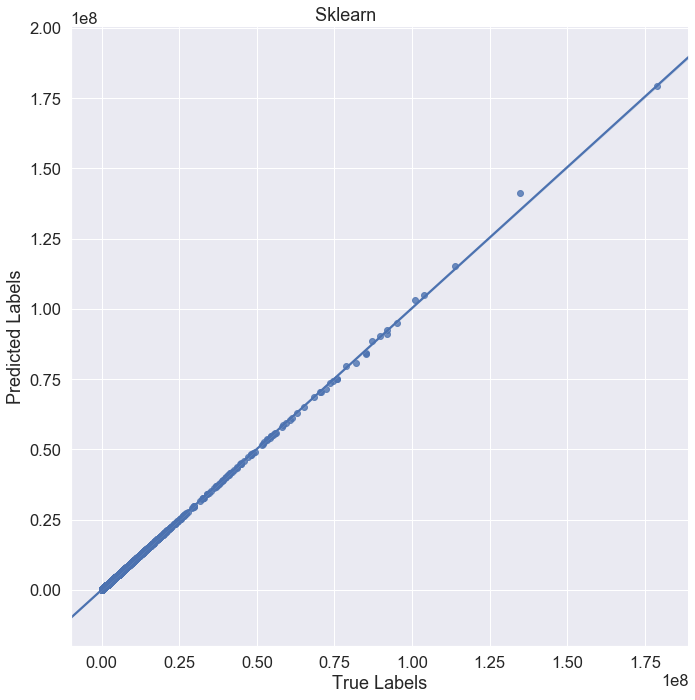

In [70]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import Imputer

data_prdc = data1.drop(['views','video_id', 'trending_date','publish_date',
                          'publish_time', 'publish_hour'], axis=1)
X_train, X_test, Y_train, Y_test = train_test_split(data_prdc, views, random_state=666,test_size = 0.2)
X_train = Imputer().fit_transform(X_train)
nEstimator = [140,160,180,200,220]
depth = [10,15,20,25,30]

RF = RandomForestRegressor()
hyperParam = [{'n_estimators':nEstimator,'max_depth': depth}]
gsv = GridSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='r2',n_jobs=-1)
gsv.fit(X_train, Y_train)
maxDepth=gsv.best_params_['max_depth']
nEstimators=gsv.best_params_['n_estimators']

model = RandomForestRegressor(n_estimators = nEstimators,max_depth=maxDepth)
model.fit(X_train, Y_train)


# predicting the  test set results
y_pred = model.predict(X_test)
print('Root means score', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('Variance score: %.2f' % r2_score(Y_test, y_pred))
print("Result :",model.score(X_test, Y_test))
d1 = {'True Labels': Y_test, 'Predicted Labels': y_pred}
SK = pd.DataFrame(data = d1)

lm1 = sns.lmplot(x="True Labels", y="Predicted Labels", data = SK, size = 10)
fig1 = lm1.fig 
fig1.suptitle("Sklearn ", fontsize=18)
sns.set(font_scale = 1.5)

### <a name = "4.3"></a>4.3 Predicing Likes

4.3.1. Linear Regression

In [71]:
likes=us_videos['likes']
youtube_like=us_videos.drop(['likes'],axis=1,inplace=False)
X_train, X_test, Y_train, Y_test = train_test_split(data_prdc, views, random_state=666,test_size = 0.2)
X_train = Imputer().fit_transform(X_train)

/Users/harold/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:66: DeprecationWarning:

Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.



/Users/harold/anaconda3/lib/python3.7/site-packages/seaborn/regression.py:546: UserWarning:

The `size` paramter has been renamed to `height`; please update your code.



Root means score 3156602.4592146277
Variance score: 0.80
Result : 0.7970430529429988


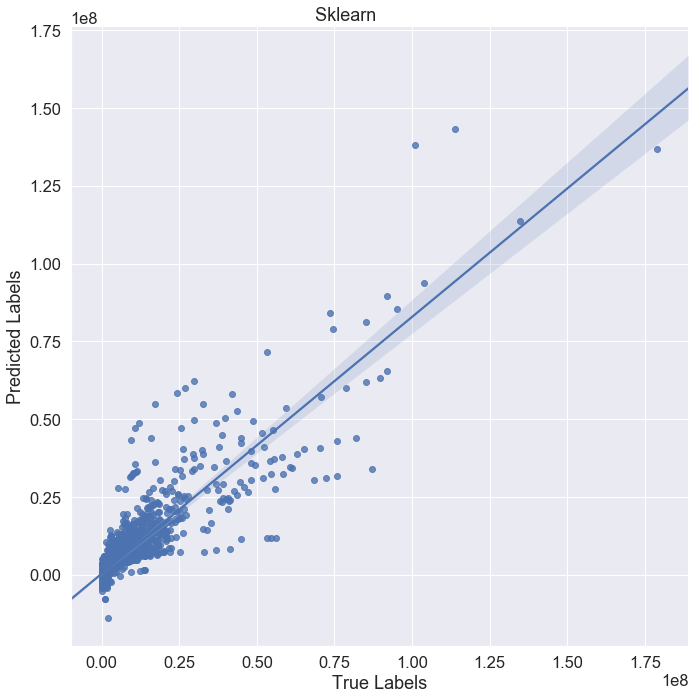

In [72]:
model = LinearRegression()
model.fit(X_train, Y_train)
y_pred = model.predict(X_test)
print('Root means score', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('Variance score: %.2f' % r2_score(Y_test, y_pred))
print("Result :",model.score(X_test, Y_test))
d1 = {'True Labels': Y_test, 'Predicted Labels': y_pred}
SK = pd.DataFrame(data = d1)
lm1 = sns.lmplot(x="True Labels", y="Predicted Labels", data = SK, size = 10)
fig1 = lm1.fig 
fig1.suptitle("Sklearn ", fontsize=18)
sns.set(font_scale = 1.5)

4.3.2 Random Forest

Root means score 86669.26596769485
Variance score: 1.00
Result : 0.9998469989620032


/Users/harold/anaconda3/lib/python3.7/site-packages/seaborn/regression.py:546: UserWarning:

The `size` paramter has been renamed to `height`; please update your code.



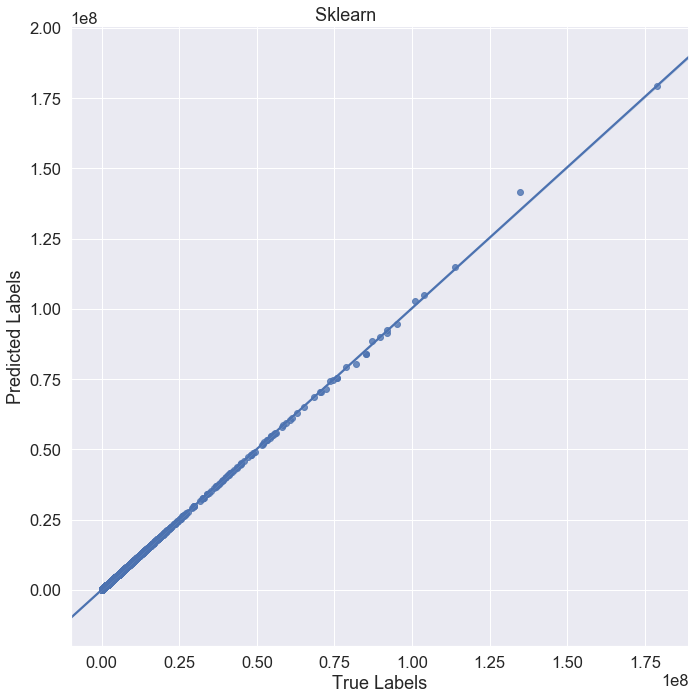

In [73]:
# nEstimator = [140,160,180,200,220]
# depth = [10,15,20,25,30]

# RF = RandomForestRegressor()
# hyperParam = [{'n_estimators':nEstimator,'max_depth': depth}]
# gsv = GridSearchCV(RF,hyperParam,cv=5,verbose=1,scoring='r2',n_jobs=-1)
# gsv.fit(X_train, y_train)
# print("Best HyperParameter: ",gsv.best_params_)
# print(gsv.best_score_)
# scores = gsv.cv_results_['mean_test_score'].reshape(len(nEstimator),len(depth))

# plt.figure(figsize=(8, 8))
# plt.subplots_adjust(left=.2, right=0.95, bottom=0.15, top=0.95)
# plt.imshow(scores, interpolation='nearest', cmap=plt.cm.hot)
# plt.xlabel('n_estimators')
# plt.ylabel('max_depth')
# plt.colorbar()
# plt.xticks(np.arange(len(nEstimator)), nEstimator)
# plt.yticks(np.arange(len(depth)), depth)
# plt.title('Grid Search r^2 Score')
# plt.show()
# maxDepth=gsv.best_params_['max_depth']
# nEstimators=gsv.best_params_['n_estimators']

model = RandomForestRegressor(n_estimators = nEstimators,max_depth=maxDepth)
model.fit(X_train, Y_train)


# predicting the  test set results
y_pred = model.predict(X_test)
print('Root means score', np.sqrt(mean_squared_error(Y_test, y_pred)))
print('Variance score: %.2f' % r2_score(Y_test, y_pred))
print("Result :",model.score(X_test, Y_test))
d1 = {'True Labels': Y_test, 'Predicted Labels': y_pred}
SK = pd.DataFrame(data = d1)

lm1 = sns.lmplot(x="True Labels", y="Predicted Labels", data = SK, size = 10)
fig1 = lm1.fig 
fig1.suptitle("Sklearn ", fontsize=18)
sns.set(font_scale = 1.5)


### <a name = "4.4"> </a>4.4 Predicting number of Comments

#### <a name = "4.4.1"></a>4.4.1 Linear Regression

In [74]:

comment_count=us_videos['comment_count']
youtube_comment=us_videos.drop(['comment_count'],axis=1,inplace=False)
comment_count = comment_count.apply(pd.to_numeric, errors='coerce')
youtube_comment=youtube_comment.apply(pd.to_numeric, errors='coerce')
comment_count.fillna(0, inplace=True)
youtube_comment.fillna(0, inplace=True)
X_train,X_test,y_train,y_test=train_test_split(youtube_comment,comment_count, test_size=0.2,shuffle=False)



Root means score 5215.168534035067
Variance score: -171.18
Result : -171.18385003282128


/Users/harold/anaconda3/lib/python3.7/site-packages/seaborn/regression.py:546: UserWarning:

The `size` paramter has been renamed to `height`; please update your code.



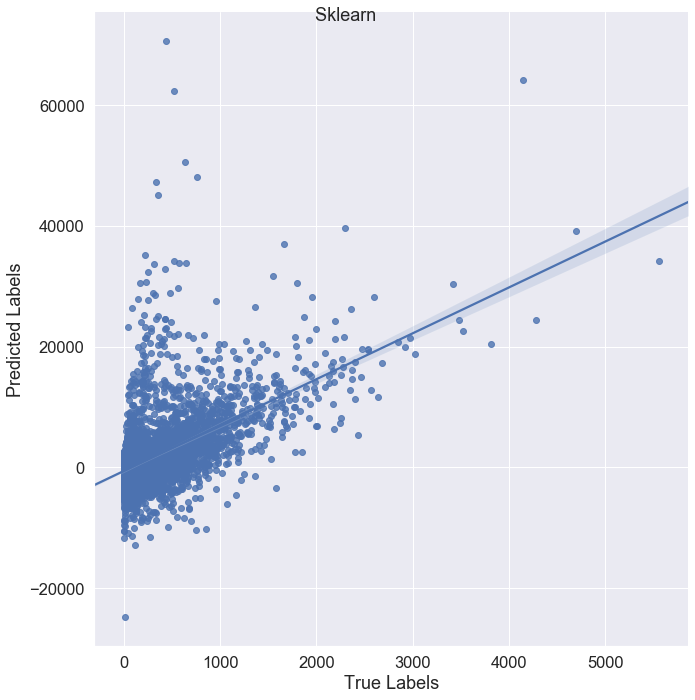

In [75]:
model = LinearRegression()
model.fit(X_train, y_train)

# predicting the  test set results
y_pred = model.predict(X_test)
print('Root means score', np.sqrt(mean_squared_error(y_test, y_pred)))
print('Variance score: %.2f' % r2_score(y_test, y_pred))
print("Result :",model.score(X_test, y_test))
d1 = {'True Labels': y_test, 'Predicted Labels': y_pred}
SK = pd.DataFrame(data = d1)

lm1 = sns.lmplot(x="True Labels", y="Predicted Labels", data = SK, size = 10)
fig1 = lm1.fig 
fig1.suptitle("Sklearn ", fontsize=18)
sns.set(font_scale = 1.5)


#### <a name = "4.4.2"></a>4.4.2. Random Forest

Root means score 0.08974917850401151
Variance score: 1.00
Result : 0.9999999490062813


/Users/harold/anaconda3/lib/python3.7/site-packages/seaborn/regression.py:546: UserWarning:

The `size` paramter has been renamed to `height`; please update your code.



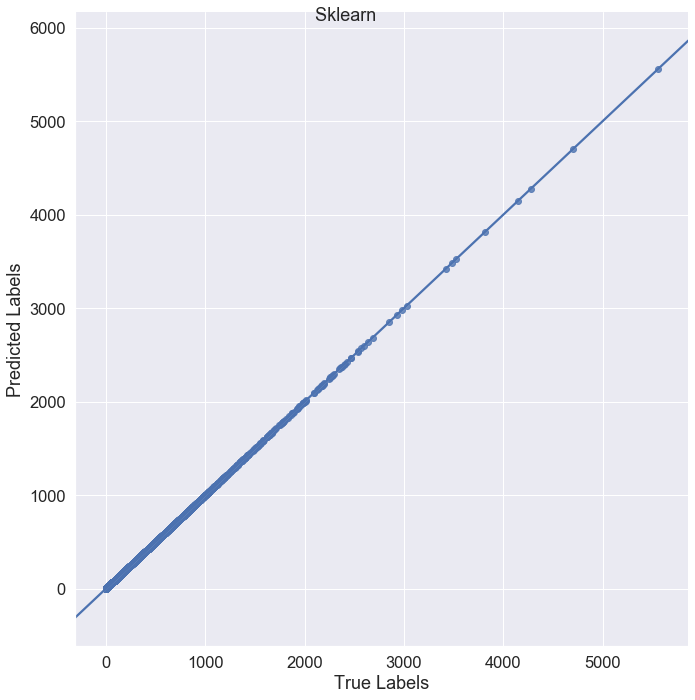

In [76]:
model = RandomForestRegressor(n_estimators = nEstimators,max_depth=maxDepth)
model.fit(X_train, y_train)


# predicting the  test set results
y_pred = model.predict(X_test)
print('Root means score', np.sqrt(mean_squared_error(y_test, y_pred)))
print('Variance score: %.2f' % r2_score(y_test, y_pred))
print("Result :",model.score(X_test, y_test))
d1 = {'True Labels': y_test, 'Predicted Labels': y_pred}
SK = pd.DataFrame(data = d1)

lm1 = sns.lmplot(x="True Labels", y="Predicted Labels", data = SK, size = 10)
fig1 = lm1.fig 
fig1.suptitle("Sklearn ", fontsize=18)
sns.set(font_scale = 1.5)


### <a name="4.5"></a>4.5 Classification

<h4> tags </h4>

In [77]:
str = []
for tag in data_us.tags:
    str.extend(tag.split("|"))
# print(len(str))
word_count = pd.Series(str).drop_duplicates()
word_count_drop_dupli = pd.Series(word_count.values)  # reset index
#print(word_count)

<h4>rating create</h4>

In [78]:
# data1['rating'] = (data1.views + data1.likes + data1.dislikes
#                    + data1.comment_count) * (1/data1.interval_to_trend)

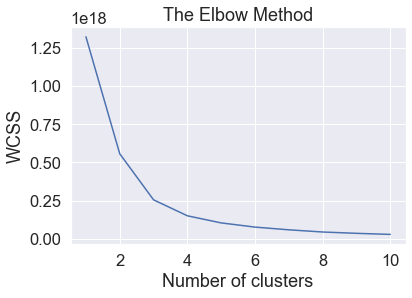

In [79]:
from sklearn.cluster import KMeans
cluster = us_videos[['likes','dislikes', 'views', 'comment_count']]
wcss = []
for i in range(1,11):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=300,n_init=10,random_state=0)
    kmeans.fit(cluster)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()



<b>After normalization</b>

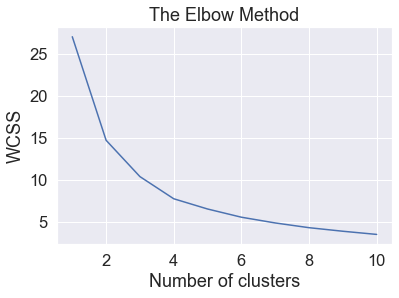

In [80]:
df2 = cluster.apply(lambda x:(x.astype(float) - min(x))/(max(x)-min(x)), axis = 0)
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=300,n_init=10,random_state=0)
    kmeans.fit(df2)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

Set 5 clusters to do classification

In [81]:
kmeans = KMeans(n_clusters=5,init='k-means++',max_iter=300,n_init=10,random_state=0) 
y_kmeans = kmeans.fit_predict(df2)
df2['cluster']=y_kmeans

In [82]:
from plotly.graph_objs import *
trace1 = go.Scatter3d(
    x = df2['likes'].values,
    y = df2['comment_count'].values,
    z = df2['views'].values,
    mode='markers',
    marker=dict(
        size=12,
        color=df2['cluster'].values,# set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
    
)

data = [trace1]
layout = go.Layout(
    scene=Scene(
        xaxis=XAxis(title='Likes'),
        yaxis=YAxis(title='Comment'),
        zaxis=ZAxis(title='Views')
        ),
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    ),
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

/Users/harold/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:550: DeprecationWarning:

plotly.graph_objs.XAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.XAxis
  - plotly.graph_objs.layout.scene.XAxis


/Users/harold/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:578: DeprecationWarning:

plotly.graph_objs.YAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.YAxis
  - plotly.graph_objs.layout.scene.YAxis


/Users/harold/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:603: DeprecationWarning:

plotly.graph_objs.ZAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.scene.ZAxis


/Users/harold/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:494: DeprecationWarning:

plotly.graph_objs.Scene is deprecated.
P

## <a name="5"></a>5. Conclusion

### Views Predicition

|Model|Variance|Result|
|-----|--------|------|
|Linear Regression|0.83|0.834|
|Random Forests|1|0.994|

### Likes Predicition

|Model|Variance|Result|
|-----|--------|------|
|Linear Regression|0.8|0.799|
|Random Forests|1|0.999|


### Number of Comments Prediction

|Model|Variance|Result|
|-----|--------|------|
|Linear Regression|-171|-171.16
|
|Random Forests|1|0.999|


## <a name="6"></a>6. Reference

<p>The dataset link: <a>https://www.kaggle.com/datasnaek/youtube-new</a><p>

# Thanks for watching!

In [ ]:
# import antigravity
import this